In [2]:
# load metadata
# metadata
Italy1_curatedmetagenomics_metadata <- read.delim('/Users/zihuahuang/Documents/SSMS/data/metadata/Italy1_metadata.tsv')
Italy1_filereport_read_run <- read.delim('/Users/zihuahuang/Documents/SSMS/data/metadata/Itay1_Italy2_PRJNA447983_tsv.txt')
Italy1_metadata <- merge(x = Italy1_curatedmetagenomics_metadata,
                         y = Italy1_filereport_read_run,
                         by.x = 'subject_id',
                         by.y = 'sample_alias',
                         all.x = TRUE)
Italy2_curatedmetagenomics_metadata <- read.csv('/Users/zihuahuang/Documents/SSMS/data/metadata/Italy2_metadata.csv')
Italy2_metadata <- merge(x = Italy2_curatedmetagenomics_metadata,
                         y = Italy1_filereport_read_run,
                         by.x = 'subject_id',
                         by.y = 'sample_alias',
                         all.x = TRUE)

Austria_metadata <- read.delim('/Users/zihuahuang/Documents/SSMS/data/metadata/Austria_metadata.tsv')

# mgs
Italy2_mgs_level4ec <- read.delim('data/level4ec_and_pathway/mgs_level4ec_relab_unstratified/Italy2_mgs_level4ec_relab_unstratified.tsv', row.names = 1)
Italy1_mgs_level4ec <- read.delim('data/level4ec_and_pathway/mgs_level4ec_relab_unstratified/Italy1_mgs_level4ec_relab_unstratified.tsv', row.names = 1)
Austria_mgs_level4ec <- read.delim('data/level4ec_and_pathway/mgs_level4ec_relab_unstratified/Austria_mgs_level4ec_relab_unstratified.tsv', row.names = 1)

# shallow
Italy2_ssms_level4ec <- read.delim('data/level4ec_and_pathway/ssms_level4ec_relab_unstratified/Italy2_500K_level4ec_relab_unstratified.tsv', row.names = 1)
Italy1_ssms_level4ec <- read.delim('data/level4ec_and_pathway/ssms_level4ec_relab_unstratified/Italy1_500K_level4ec_relab_unstratified.tsv', row.names = 1)
Austria_ssms_level4ec <- read.delim('data/level4ec_and_pathway/ssms_level4ec_relab_unstratified/Austria_500K_level4ec_relab_unstratified.tsv', row.names = 1)

# imputed
predicted_level4ec_spiec_Austriaasref_Italy2 <- read.csv('data/imputed_ec/spieceasi/predicted_level4ec_spiec_Austriaasref_Italy2.csv', row.names = 1, sep = '\t')
predicted_level4ec_spiec_Austriaasref_Italy1 <- read.csv('data/imputed_ec/spieceasi/predicted_level4ec_spiec_Austriaasref_Italy1.csv', row.names = 1, sep = '\t')
predicted_level4ec_spiec_Italy1asref_Italy2 <- read.csv('data/imputed_ec/spieceasi/predicted_level4ec_spiec_Italy1asref_Italy2.csv', row.names = 1, sep = '\t')
predicted_level4ec_spiec_Italy2asref_Italy1 <- read.csv('data/imputed_ec/spieceasi/predicted_level4ec_spiec_Italy2asref_Italy1.csv', row.names = 1, sep = '\t')
predicted_level4ec_spiec_Italy1asref_Austria <- read.csv('data/imputed_ec/spieceasi/predicted_level4ec_spiec_Italy1asref_Austria.csv', row.names = 1, sep = '\t')
predicted_level4ec_spiec_Italy2asref_Austria <- read.csv('data/imputed_ec/spieceasi/predicted_level4ec_spiec_Italy2asref_Austria.csv', row.names = 1, sep = '\t')


tibble [156,312 x 3] (S3: tbl_df/tbl/data.frame)
 $ mgs    : num [1:156312] -0.2398 -0.2398 -0.3657 -0.3657 0.0271 ...
 $ type   : chr [1:156312] "ssms" "imputed_ssms" "ssms" "imputed_ssms" ...
 $ x_value: num [1:156312] 0.0356 -0.104 -0.3731 -0.2845 0.0138 ...
tibble [156,312 x 3] (S3: tbl_df/tbl/data.frame)
 $ mgs    : num [1:156312] -0.2398 -0.2398 -0.3657 -0.3657 0.0271 ...
 $ type   : chr [1:156312] "ssms" "imputed_ssms" "ssms" "imputed_ssms" ...
 $ x_value: num [1:156312] 0.0356 -0.1053 -0.3731 -0.3585 0.0138 ...


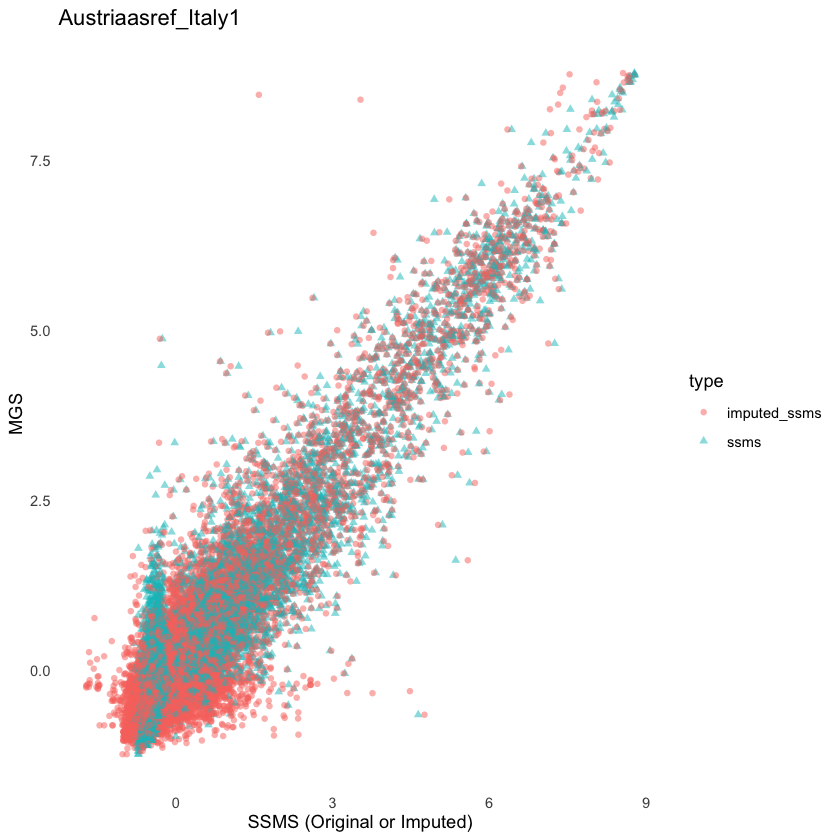

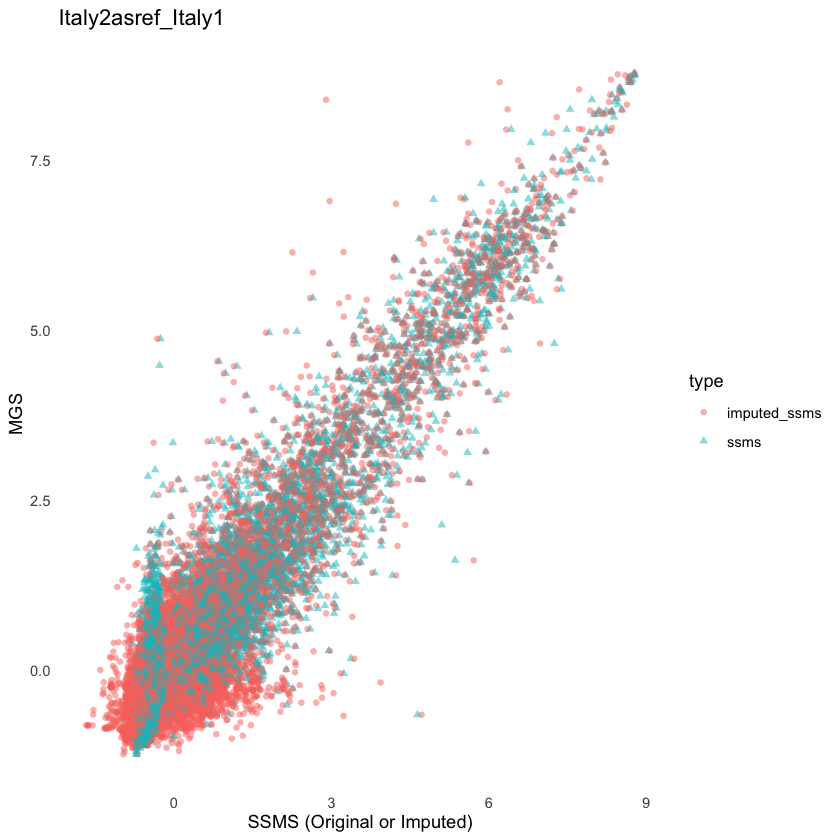

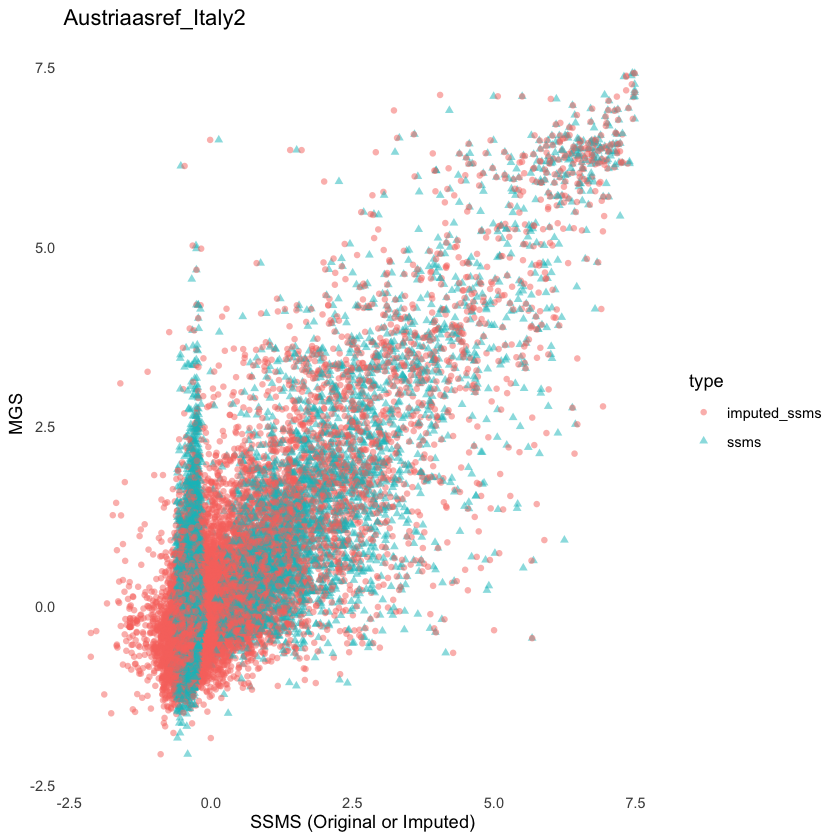

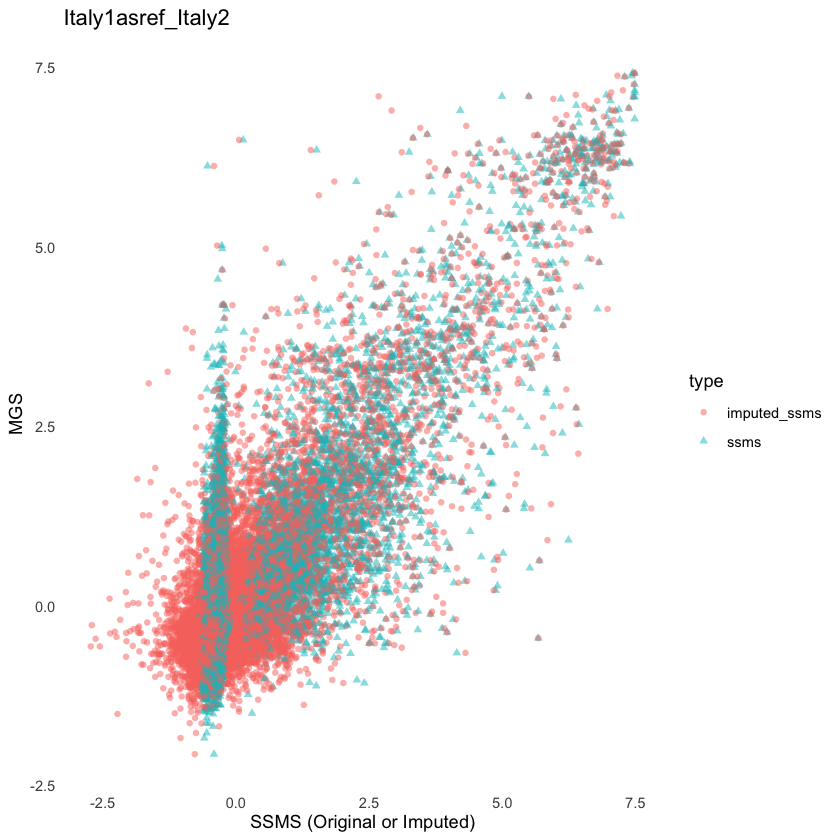

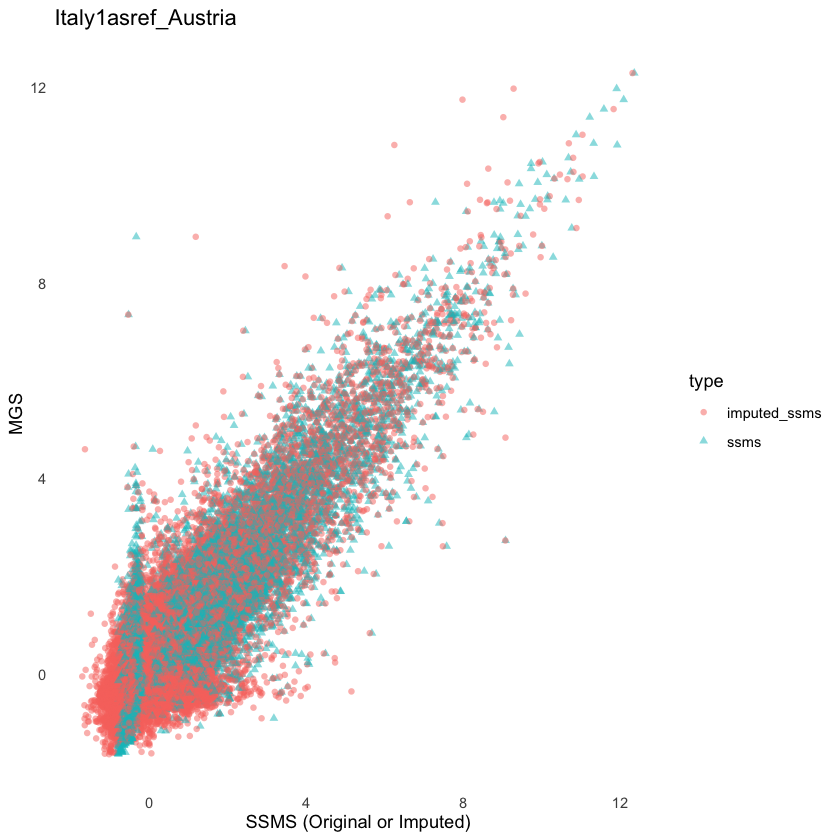

...

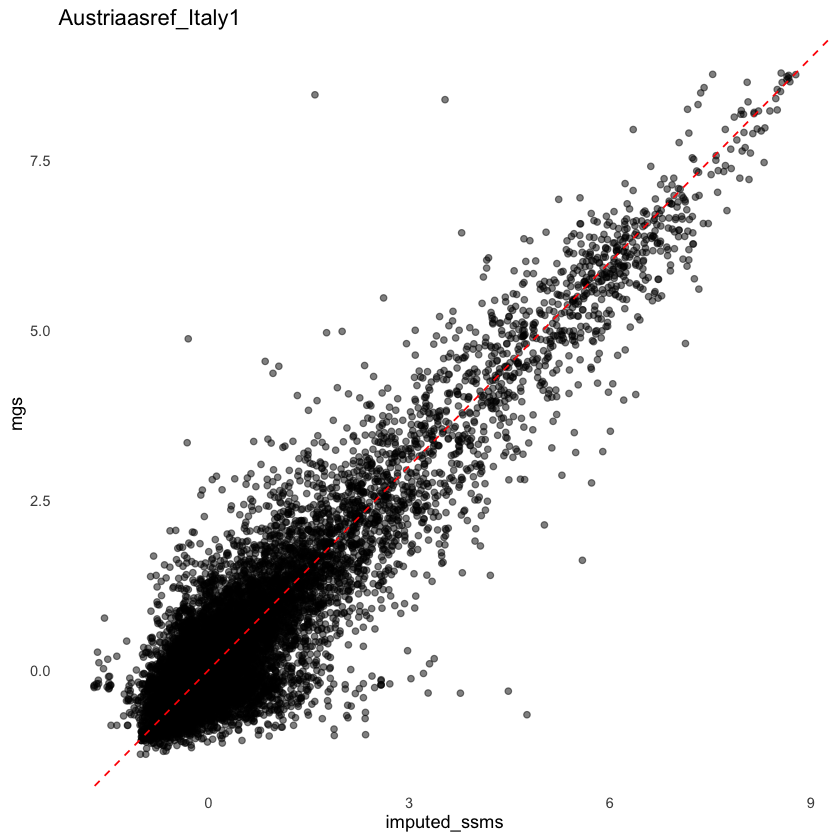

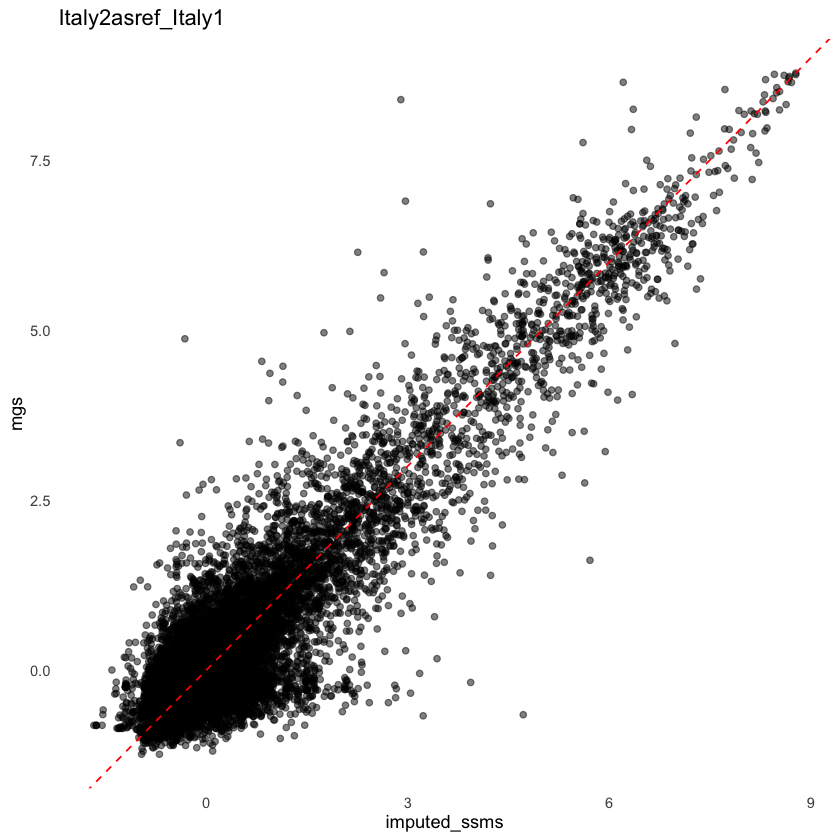

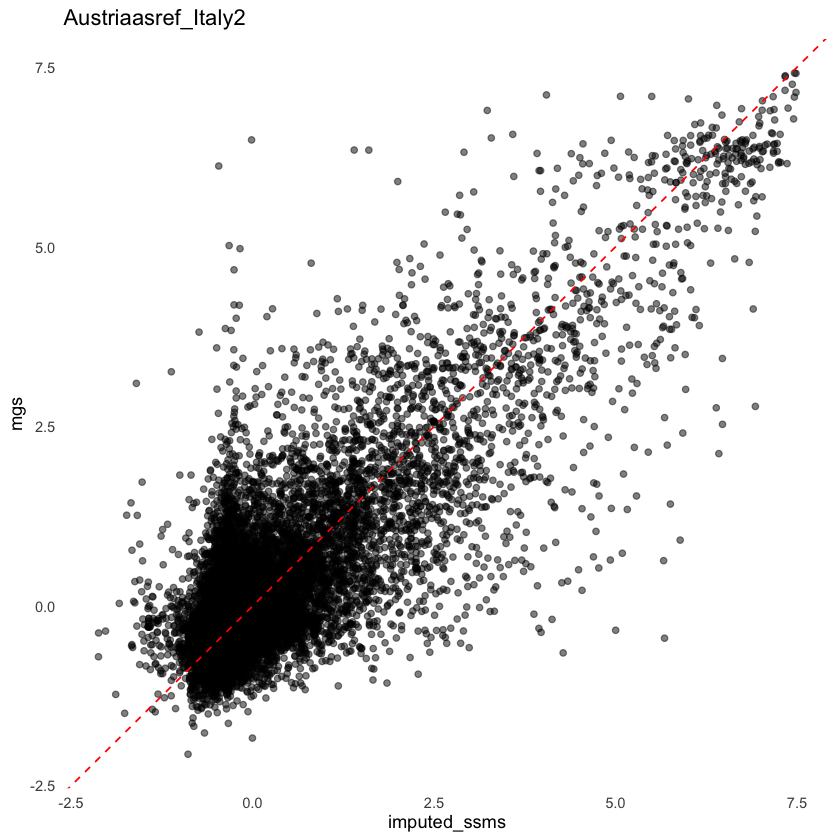

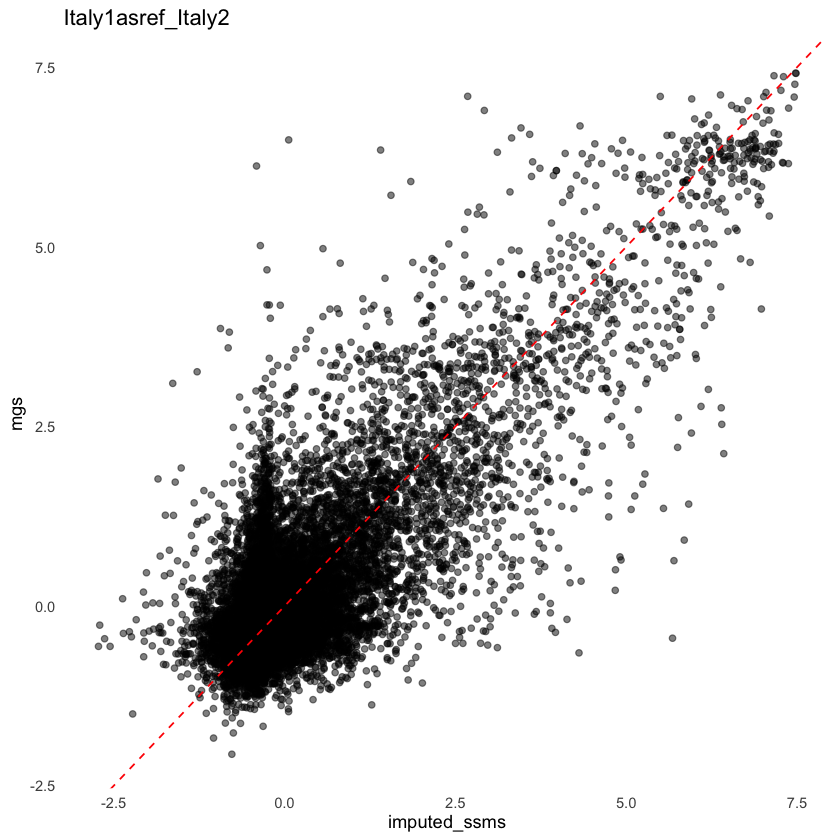

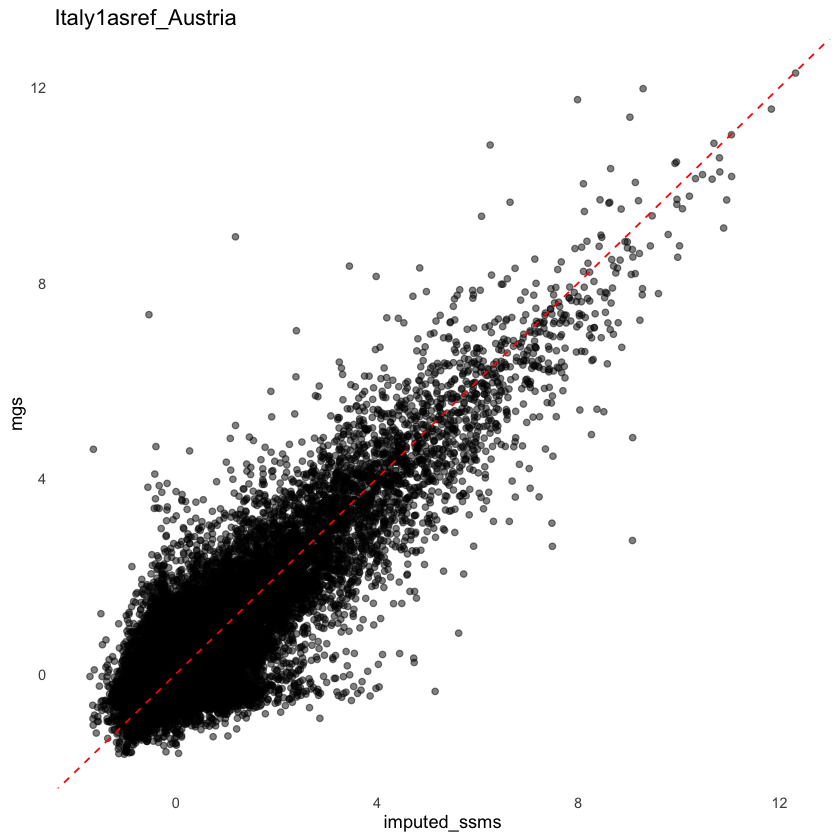

'data.frame':	78156 obs. of  3 variables:
 $ mgs         : num  -0.2398 -0.3657 0.0271 -0.1881 -0.6728 ...
 $ ssms        : num  0.0356 -0.3731 0.0138 -0.4599 -0.6532 ...
 $ imputed_ssms: num  -0.105 -0.359 -0.124 -0.533 -0.526 ...


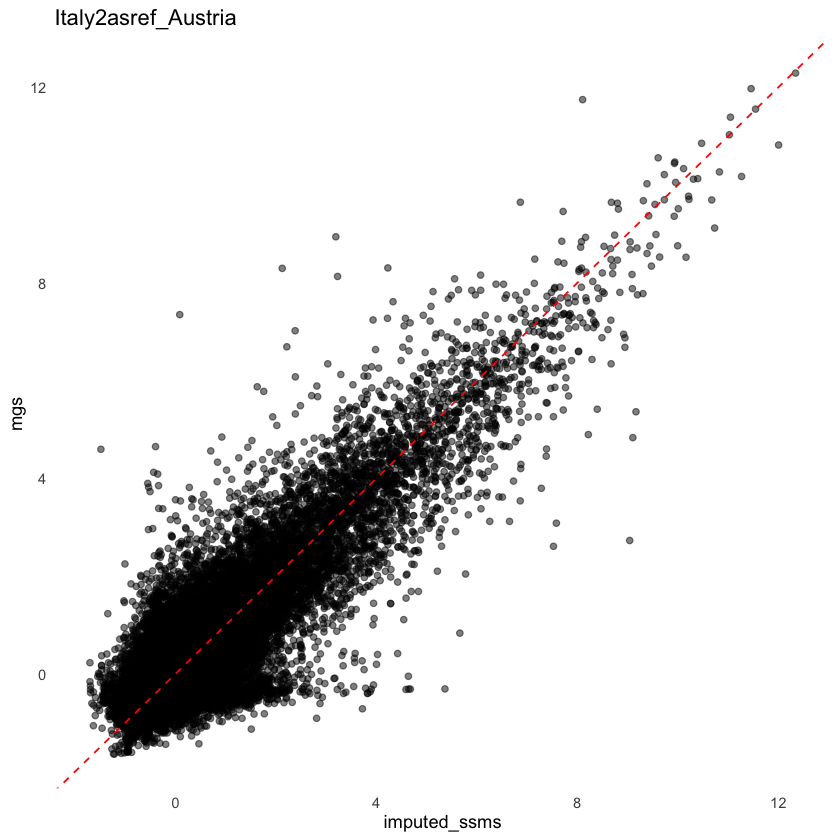

In [34]:
# z score
source("utilities.R")
library(ggplot2)
library(tidyr)

# compare different method -- among those imputed most frequently EC
Italy2_ssms_sorted <- Italy2_ssms_level4ec[order(rowSums(Italy2_ssms_level4ec), decreasing = TRUE), ]

Italy1_ssms_sorted <- Italy1_ssms_level4ec[order(rowSums(Italy1_ssms_level4ec), decreasing = TRUE), ]

Austria_ssms_sorted <- Austria_ssms_level4ec[order(rowSums(Austria_ssms_level4ec), decreasing = TRUE), ]

# sort by the original ssms abundance
Italy2_imputed_only_ec_1 <- rownames(Italy2_ssms_sorted[c(1:500),])
Italy2_imputed_only_ec_500 <- rownames(Italy2_ssms_sorted[c(500:1000),])
Italy2_imputed_only_ec_1000 <- rownames(Italy2_ssms_sorted[c(1000:1500),])

Italy1_imputed_only_ec_1 <- rownames(Italy1_ssms_sorted[c(1:500),])
Italy1_imputed_only_ec_500 <- rownames(Italy1_ssms_sorted[c(500:1000),])
Italy1_imputed_only_ec_1000 <- rownames(Italy1_ssms_sorted[c(1000:1500),])

Austria_imputed_only_ec_1 <- rownames(Austria_ssms_sorted[c(1:500),])
Austria_imputed_only_ec_500 <- rownames(Austria_ssms_sorted[c(500:1000),])
Austria_imputed_only_ec_1000 <- rownames(Austria_ssms_sorted[c(1000:1500),])

# visualize the z score of mgs, ssms, imputed ssms
Italy2_mgs_sub <- Italy2_mgs_level4ec[Italy2_imputed_only_ec_1000, ]
Italy2_ssms_sub <- Italy2_ssms_level4ec[Italy2_imputed_only_ec_1000, ]

Italy1_mgs_sub <- Italy1_mgs_level4ec[Italy1_imputed_only_ec_1000, ]
Italy1_ssms_sub <- Italy1_ssms_level4ec[Italy1_imputed_only_ec_1000, ]

Austria_mgs_sub <- Austria_mgs_level4ec[Austria_imputed_only_ec_1000, ]
Austria_ssms_sub <- Austria_ssms_level4ec[Austria_imputed_only_ec_1000, ]


predicted_level4ec_spiec_Austriaasref_Italy2_sub <- predicted_level4ec_spiec_Austriaasref_Italy2[Italy2_imputed_only_ec_1000, ]
predicted_level4ec_spiec_Italy1asref_Italy2_sub <- predicted_level4ec_spiec_Italy1asref_Italy2[Italy2_imputed_only_ec_1000, ]

predicted_level4ec_spiec_Austriaasref_Italy1_sub <- predicted_level4ec_spiec_Austriaasref_Italy1[Italy1_imputed_only_ec_1000, ]
predicted_level4ec_spiec_Italy2asref_Italy1_sub <- predicted_level4ec_spiec_Italy2asref_Italy1[Italy1_imputed_only_ec_1000, ] 

predicted_level4ec_spiec_Italy1asref_Austria_sub <- predicted_level4ec_spiec_Italy1asref_Austria[Austria_imputed_only_ec_1000, ]
predicted_level4ec_spiec_Italy2asref_Austria_sub <- predicted_level4ec_spiec_Italy2asref_Austria[Austria_imputed_only_ec_1000, ]

# for Italy2
scarlet_z_socre_Austriaasref_Italy2 <- data.frame(
    "mgs" = as.vector(t(scale(t(Italy2_mgs_sub)))),
    "ssms" = as.vector(t(scale(t(Italy2_ssms_sub)))),
    "imputed_ssms" = as.vector(t(scale(t(predicted_level4ec_spiec_Austriaasref_Italy2_sub))))
)

scarlet_z_socre_Italy1asref_Italy2 <- data.frame(
    "mgs" = as.vector(t(scale(t(Italy2_mgs_sub)))),
    "ssms" = as.vector(t(scale(t(Italy2_ssms_sub)))),
    "imputed_ssms" = as.vector(t(scale(t(predicted_level4ec_spiec_Italy1asref_Italy2_sub))))
)
# for Italy1
scarlet_z_socre_Austriaasref_Italy1 <- data.frame(
    "mgs" = as.vector(t(scale(t(Italy1_mgs_sub)))),
    "ssms" = as.vector(t(scale(t(Italy1_ssms_sub)))),
    "imputed_ssms" = as.vector(t(scale(t(predicted_level4ec_spiec_Austriaasref_Italy1_sub))))
) 
scarlet_z_socre_Italy2asref_Italy1 <- data.frame(
    "mgs" = as.vector(t(scale(t(Italy1_mgs_sub)))),
    "ssms" = as.vector(t(scale(t(Italy1_ssms_sub)))),
    "imputed_ssms" = as.vector(t(scale(t(predicted_level4ec_spiec_Italy2asref_Italy1_sub))))
) 
# for Austria
scarlet_z_socre_Italy1asref_Austria <- data.frame(
    "mgs" = as.vector(t(scale(t(Austria_mgs_sub)))),
    "ssms" = as.vector(t(scale(t(Austria_ssms_sub)))),
    "imputed_ssms" = as.vector(t(scale(t(predicted_level4ec_spiec_Italy1asref_Austria_sub))))
)
scarlet_z_socre_Italy2asref_Austria <- data.frame(  
    "mgs" = as.vector(t(scale(t(Austria_mgs_sub)))),
    "ssms" = as.vector(t(scale(t(Austria_ssms_sub)))),
    "imputed_ssms" = as.vector(t(scale(t(predicted_level4ec_spiec_Italy2asref_Austria_sub))))
) 

# 
scarlet_z_socre_Austriaasref_Italy1_long <- pivot_longer(scarlet_z_socre_Austriaasref_Italy1, cols = c(ssms, imputed_ssms), 
                        names_to = "type", values_to = "x_value")

scarlet_z_socre_Italy2asref_Italy1_long <- pivot_longer(scarlet_z_socre_Italy2asref_Italy1, cols = c(ssms, imputed_ssms), 
                                                        names_to = "type", values_to = "x_value")

scarlet_z_socre_Austriaasref_Italy2_long <- pivot_longer(scarlet_z_socre_Austriaasref_Italy2, cols = c(ssms, imputed_ssms), 
                                                        names_to = "type", values_to = "x_value")

scarlet_z_socre_Italy1asref_Italy2_long <- pivot_longer(scarlet_z_socre_Italy1asref_Italy2, cols = c(ssms, imputed_ssms), 
                                                        names_to = "type", values_to = "x_value")

scarlet_z_socre_Italy1asref_Austria_long <- pivot_longer(scarlet_z_socre_Italy1asref_Austria, cols = c(ssms, imputed_ssms), 
                                                        names_to = "type", values_to = "x_value")

scarlet_z_socre_Italy2asref_Austria_long <- pivot_longer(scarlet_z_socre_Italy2asref_Austria, cols = c(ssms, imputed_ssms), 
                                                        names_to = "type", values_to = "x_value") 

str(scarlet_z_socre_Italy1asref_Austria_long)
str(scarlet_z_socre_Italy2asref_Austria_long)


ggplot(scarlet_z_socre_Austriaasref_Italy1_long, aes(x = x_value, y = mgs, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(16, 17)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original or Imputed)",
       y = "MGS",
       title = "Austriaasref_Italy1")

ggplot(scarlet_z_socre_Italy2asref_Italy1_long, aes(x = x_value, y = mgs, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(16, 17)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original or Imputed)",
       y = "MGS",
       title = "Italy2asref_Italy1")    
ggplot(scarlet_z_socre_Austriaasref_Italy2_long, aes(x = x_value, y = mgs, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(16, 17)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original or Imputed)",
       y = "MGS",
       title = "Austriaasref_Italy2")
ggplot(scarlet_z_socre_Italy1asref_Italy2_long, aes(x = x_value, y = mgs, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(16, 17)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original or Imputed)",
       y = "MGS",
       title = "Italy1asref_Italy2")
ggplot(scarlet_z_socre_Italy1asref_Austria_long, aes(x = x_value, y = mgs, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(16, 17)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original or Imputed)",
       y = "MGS",
       title = "Italy1asref_Austria")
ggplot(scarlet_z_socre_Italy2asref_Austria_long, aes(x = x_value, y = mgs, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(16, 17)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original or Imputed)",
       y = "MGS",
       title = "Italy2asref_Austria")


### original ssms vs mgs  
ggplot(scarlet_z_socre_Austriaasref_Italy1, aes(x = ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "ssms",
       y = "mgs",
       title = "Austriaasref_Italy1") +
  theme_minimal() +
  theme(panel.grid = element_blank()) 
ggplot(scarlet_z_socre_Italy2asref_Italy1, aes(x = ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "ssms",
       y = "mgs",
       title = "Italy2asref_Italy1") +
  theme_minimal() +
  theme(panel.grid = element_blank())
ggplot(scarlet_z_socre_Austriaasref_Italy2, aes(x = ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "ssms",
       y = "mgs",
       title = "Austriaasref_Italy2") +
  theme_minimal() +
  theme(panel.grid = element_blank())
ggplot(scarlet_z_socre_Italy1asref_Italy2, aes(x = ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "ssms",
       y = "mgs",
       title = "Italy1asref_Italy2") +
  theme_minimal() +
  theme(panel.grid = element_blank())
ggplot(scarlet_z_socre_Italy1asref_Austria, aes(x = ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "ssms",    
       y = "mgs",
       title = "Italy1asref_Austria") +
  theme_minimal() +
  theme(panel.grid = element_blank())
ggplot(scarlet_z_socre_Italy2asref_Austria, aes(x = ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype =  "dashed", color = "red") +
  labs(x = "ssms",
       y = "mgs",
       title = "Italy2asref_Austria") +
  theme_minimal() +
  theme(panel.grid = element_blank()) 


### imputed ssms vs mgs
ggplot(scarlet_z_socre_Austriaasref_Italy1, aes(x = imputed_ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "imputed_ssms",
       y = "mgs",
       title = "Austriaasref_Italy1") +
  theme_minimal() +
  theme(panel.grid = element_blank())
ggplot(scarlet_z_socre_Italy2asref_Italy1, aes(x = imputed_ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "imputed_ssms",
       y = "mgs",
       title = "Italy2asref_Italy1") +
  theme_minimal() +
  theme(panel.grid = element_blank())  
ggplot(scarlet_z_socre_Austriaasref_Italy2, aes(x = imputed_ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "imputed_ssms",
       y = "mgs",
       title = "Austriaasref_Italy2") +
  theme_minimal() +
  theme(panel.grid = element_blank())
ggplot(scarlet_z_socre_Italy1asref_Italy2, aes(x = imputed_ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype =  "dashed", color = "red") +
  labs(x = "imputed_ssms",
       y = "mgs",
       title = "Italy1asref_Italy2") +
  theme_minimal() +
  theme(panel.grid = element_blank())   
ggplot(scarlet_z_socre_Italy1asref_Austria, aes(x = imputed_ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "imputed_ssms",
       y = "mgs",
       title = "Italy1asref_Austria") +
  theme_minimal() +
  theme(panel.grid = element_blank())   
ggplot(scarlet_z_socre_Italy2asref_Austria, aes(x = imputed_ssms, y = mgs)) +
  geom_point(alpha = 0.5) +
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  labs(x = "imputed_ssms",
       y = "mgs",
       title = "Italy2asref_Austria") +
  theme_minimal() +
  theme(panel.grid = element_blank()) 

str(scarlet_z_socre_Italy2asref_Austria)
#ggplot(scarlet_z_socre, aes(x = imputed_ssms, y = mgs)) +
#  geom_point(alpha = 0.5) +
#  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
#  labs(x = "imputed_ssms",
#       y = "mgs",
#       title = "imputed ssms vs mgs") +
#  theme_minimal() +
#  theme(panel.grid = element_blank()) 


# residule visulization
#residule_mgs_ssms <- t(scale(t(Italy2_mgs_sub))) - t(scale(t(Italy2_ssms_sub)))
#pheatmap(residule_mgs_ssms,
 
# cluster_rows = FALSE,
#         show_rownames = FALSE,
#        show_colnames = FALSE,
#         color = color_palette,
#         main = "z-score residule_mgs_ssms"
#)

 num [1:29058] 1.26e-06 1.78e-05 7.22e-06 4.20e-05 7.43e-06 ...
'data.frame':	501 obs. of  3 variables:
 $ mgs         : num  8.34e-06 6.43e-06 4.75e-06 5.82e-06 9.76e-06 ...
 $ ssms        : num  4.13e-06 4.13e-06 4.05e-06 4.05e-06 4.05e-06 ...
 $ imputed_ssms: num  6.51e-06 5.92e-06 4.44e-06 5.25e-06 7.61e-06 ...


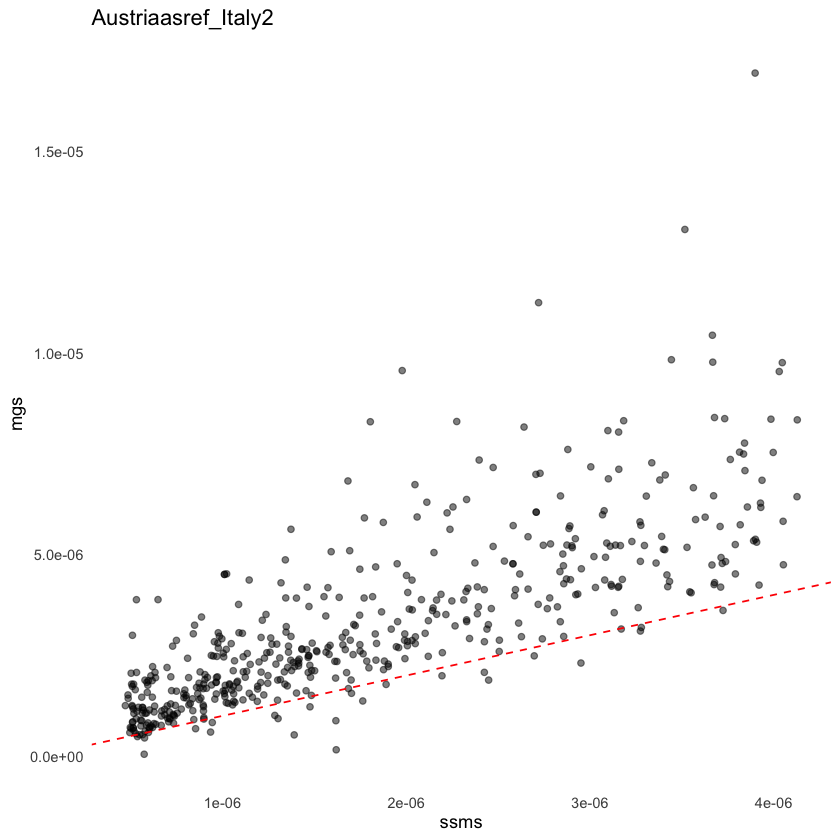

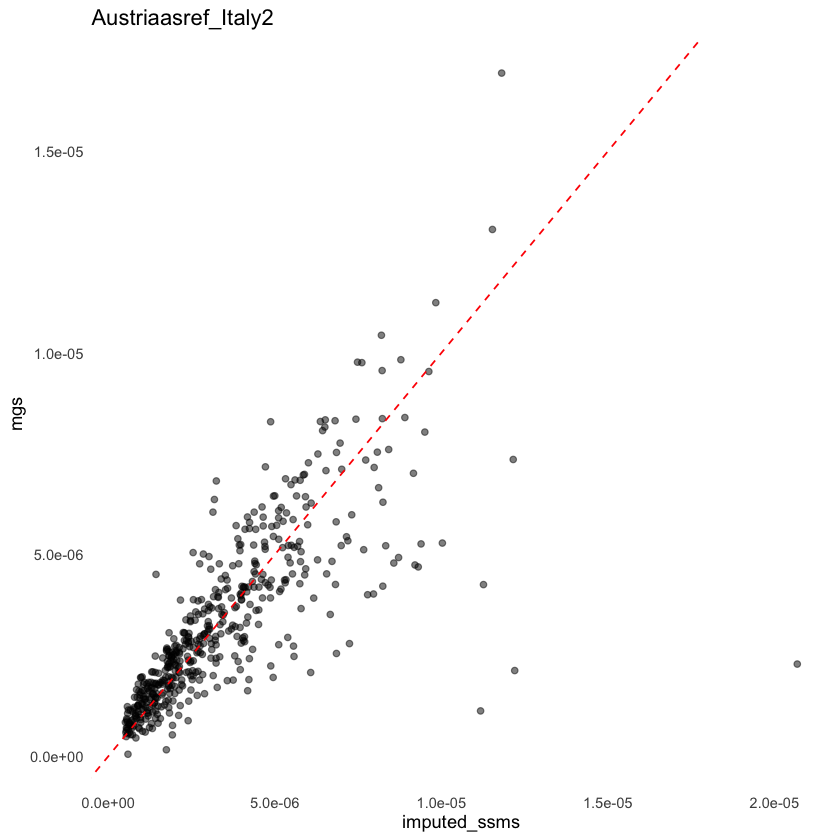

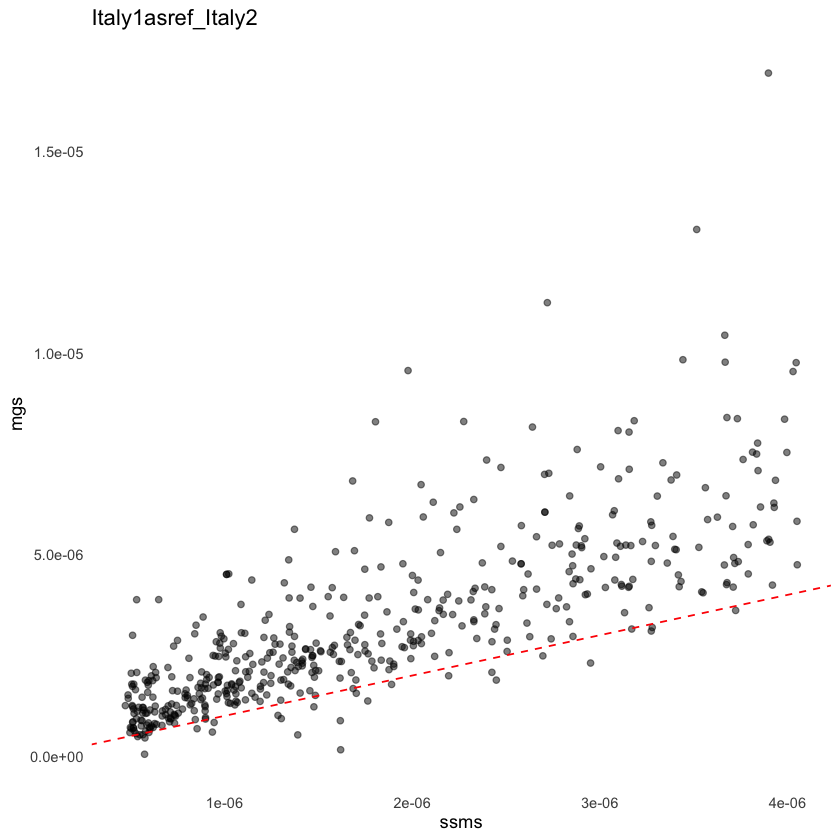

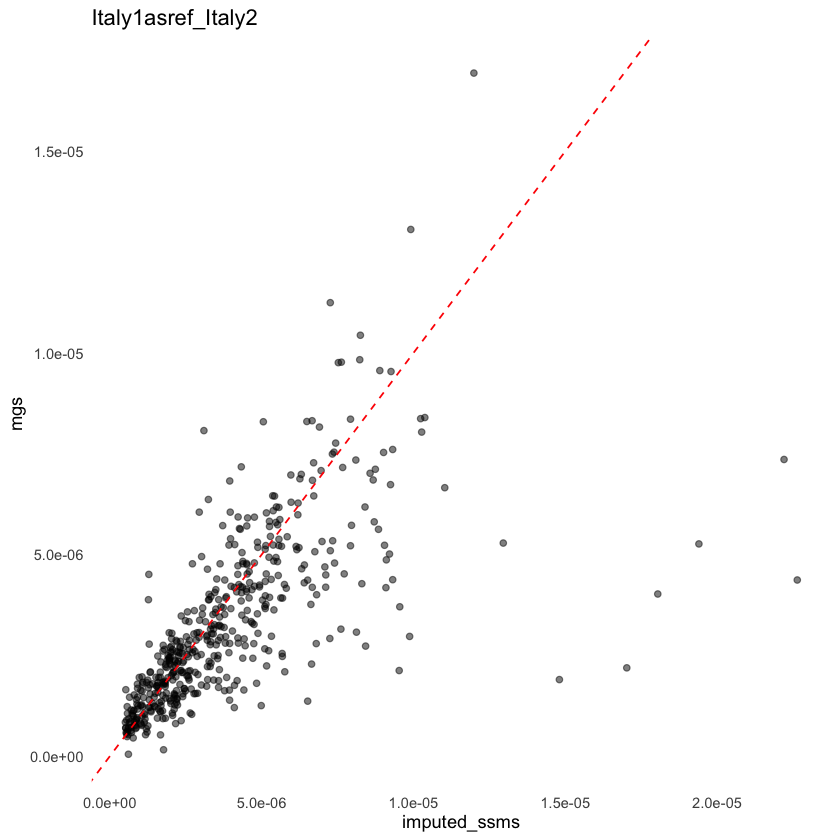

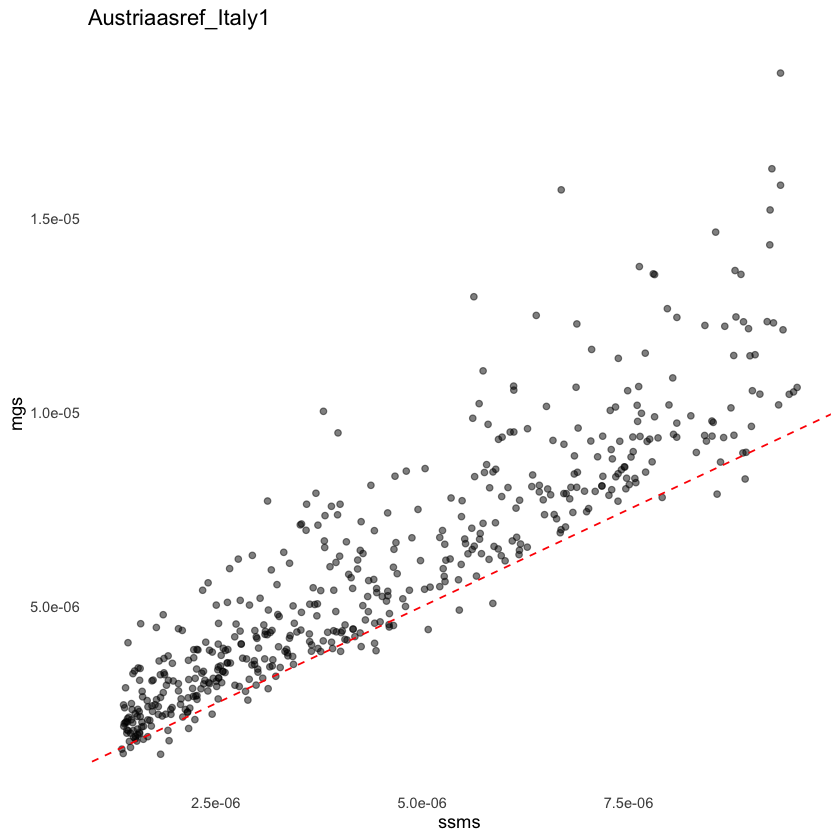

...

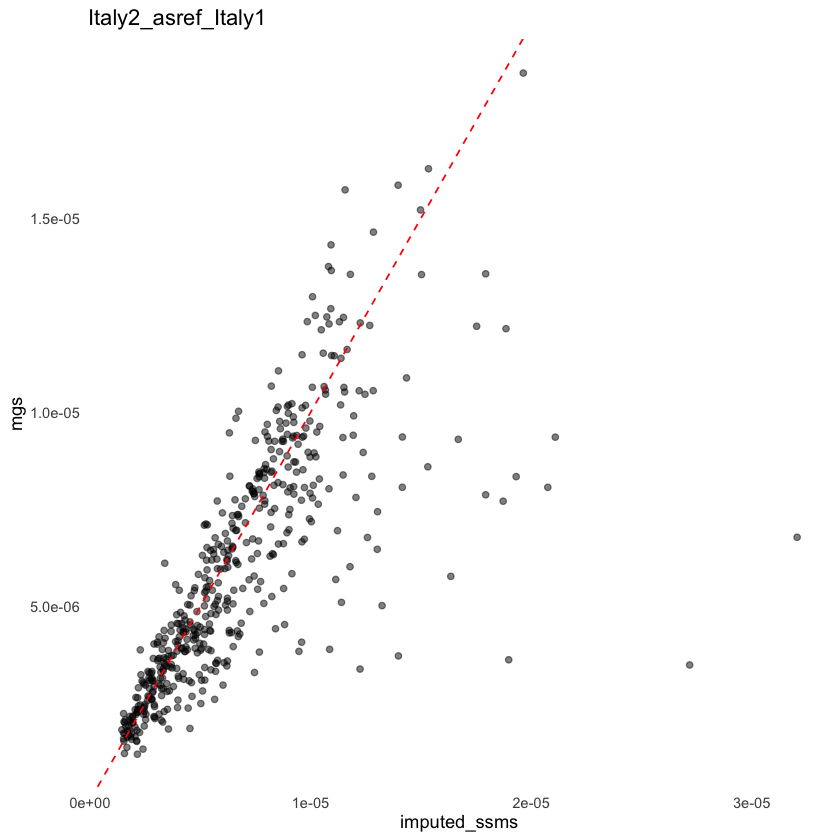

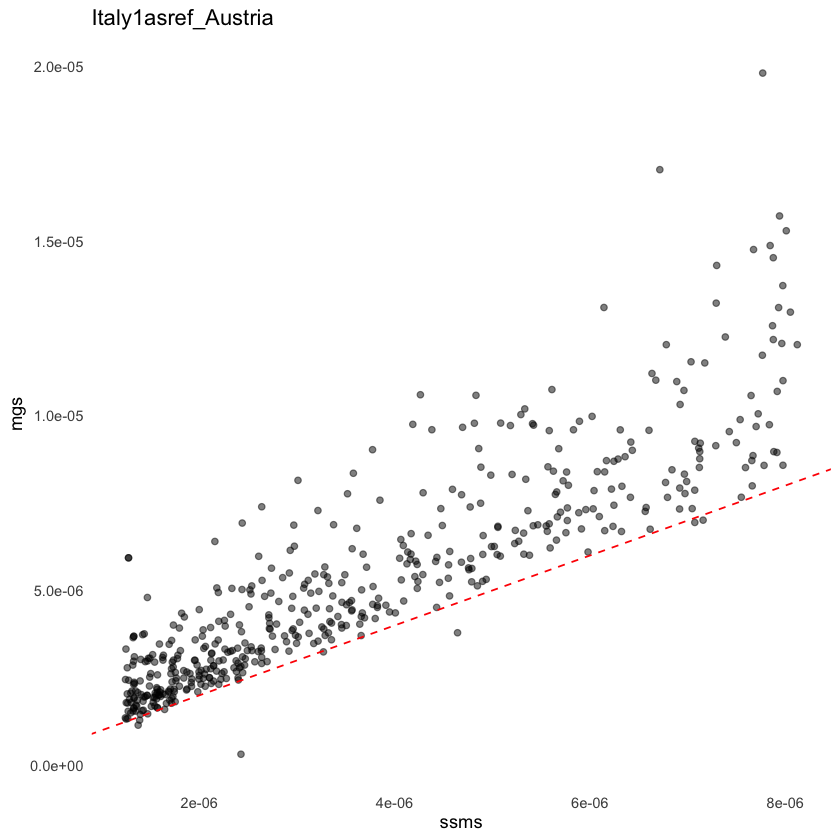

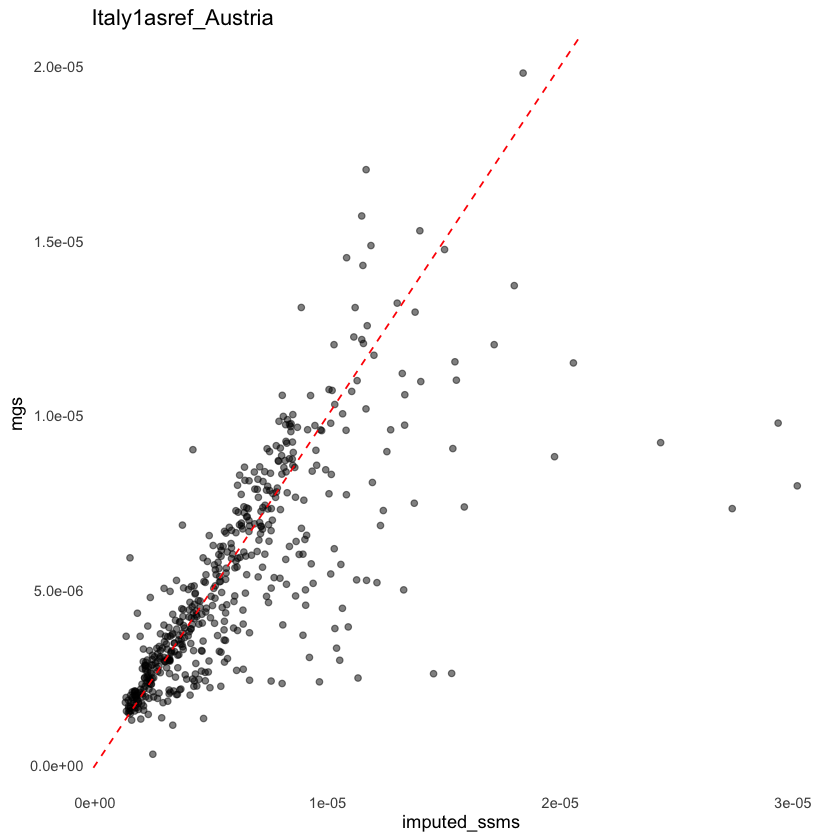

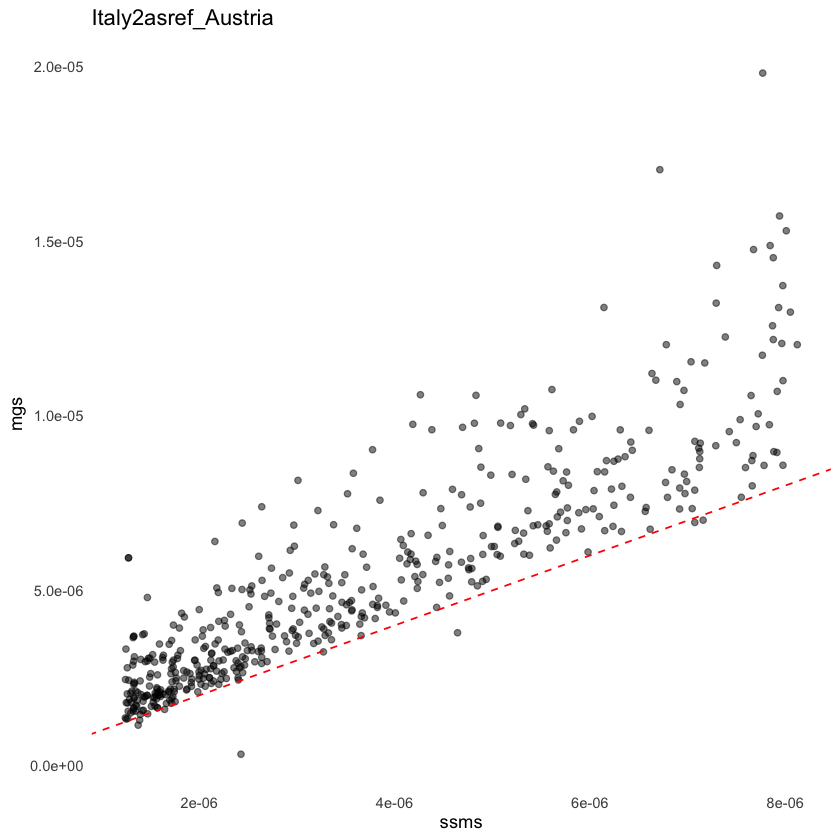

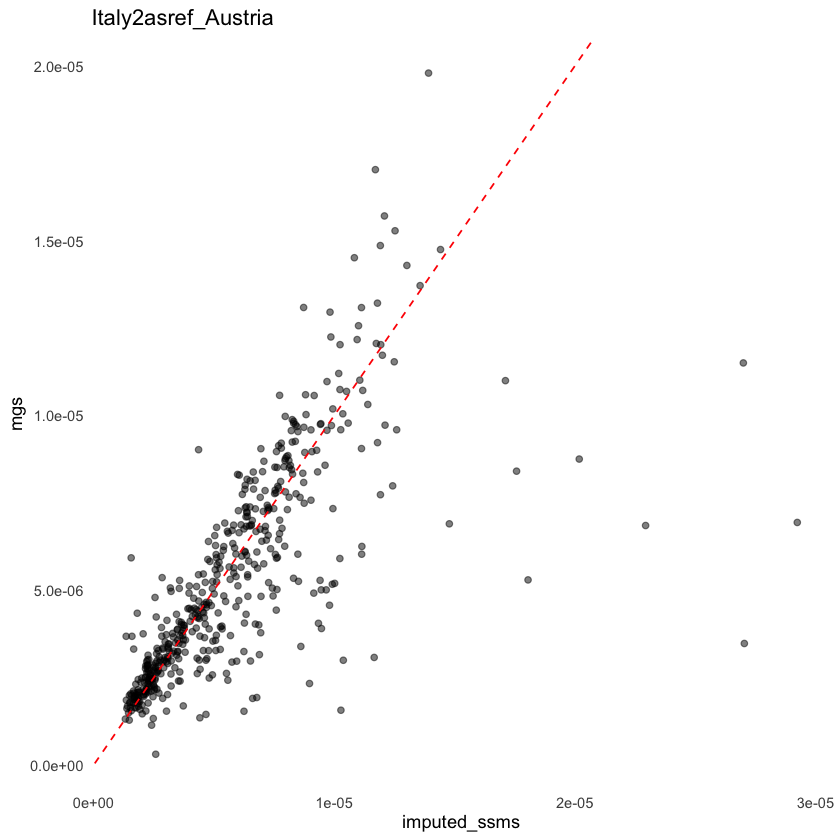

In [ ]:
# abundance
source("utilities.R")
library(ggplot2)
library(tidyr)

# compare different method -- among those imputed most frequently EC
Italy2_ssms_sorted <- Italy2_ssms_level4ec[order(rowSums(Italy2_ssms_level4ec), decreasing = TRUE), ]

Italy1_ssms_sorted <- Italy1_ssms_level4ec[order(rowSums(Italy1_ssms_level4ec), decreasing = TRUE), ]

Austria_ssms_sorted <- Austria_ssms_level4ec[order(rowSums(Austria_ssms_level4ec), decreasing = TRUE), ]

# sort by the original ssms abundance
Italy2_imputed_only_ec_1 <- rownames(Italy2_ssms_sorted[c(1:500),])
Italy2_imputed_only_ec_500 <- rownames(Italy2_ssms_sorted[c(500:1000),])
Italy2_imputed_only_ec_1000 <- rownames(Italy2_ssms_sorted[c(1000:1500),])
Italy2_imputed_only_ec_all <- rownames(Italy2_ssms_sorted)

Italy1_imputed_only_ec_1 <- rownames(Italy1_ssms_sorted[c(1:500),])
Italy1_imputed_only_ec_500 <- rownames(Italy1_ssms_sorted[c(500:1000),])
Italy1_imputed_only_ec_1000 <- rownames(Italy1_ssms_sorted[c(1000:1500),])
Italy1_imputed_only_ec_all <- rownames(Italy1_ssms_sorted)

Austria_imputed_only_ec_1 <- rownames(Austria_ssms_sorted[c(1:500),])
Austria_imputed_only_ec_500 <- rownames(Austria_ssms_sorted[c(500:1000),])
Austria_imputed_only_ec_1000 <- rownames(Austria_ssms_sorted[c(1000:1500),])
Austria_imputed_only_ec_all <- rownames(Austria_ssms_sorted)

# visualize the z score of mgs, ssms, imputed ssms
Italy2_mgs_sub <- Italy2_mgs_level4ec[Italy2_imputed_only_ec_1000, ]
Italy2_ssms_sub <- Italy2_ssms_level4ec[Italy2_imputed_only_ec_1000, ]

Italy1_mgs_sub <- Italy1_mgs_level4ec[Italy1_imputed_only_ec_1000, ]
Italy1_ssms_sub <- Italy1_ssms_level4ec[Italy1_imputed_only_ec_1000, ]

Austria_mgs_sub <- Austria_mgs_level4ec[Austria_imputed_only_ec_1000, ]
Austria_ssms_sub <- Austria_ssms_level4ec[Austria_imputed_only_ec_1000, ]


predicted_level4ec_spiec_Austriaasref_Italy2_sub <- predicted_level4ec_spiec_Austriaasref_Italy2[Italy2_imputed_only_ec_1000, ]
predicted_level4ec_spiec_Italy1asref_Italy2_sub <- predicted_level4ec_spiec_Italy1asref_Italy2[Italy2_imputed_only_ec_1000, ]

predicted_level4ec_spiec_Austriaasref_Italy1_sub <- predicted_level4ec_spiec_Austriaasref_Italy1[Italy1_imputed_only_ec_1000, ]
predicted_level4ec_spiec_Italy2asref_Italy1_sub <- predicted_level4ec_spiec_Italy2asref_Italy1[Italy1_imputed_only_ec_1000, ] 

predicted_level4ec_spiec_Italy1asref_Austria_sub <- predicted_level4ec_spiec_Italy1asref_Austria[Austria_imputed_only_ec_1000, ]
predicted_level4ec_spiec_Italy2asref_Austria_sub <- predicted_level4ec_spiec_Italy2asref_Austria[Austria_imputed_only_ec_1000, ]

# for Italy2
scarlet_abundance_Austriaasref_Italy2 <- data.frame(
    "mgs" = as.vector(apply(Italy2_mgs_sub,1,mean)),
    "ssms" = as.vector(apply(Italy2_ssms_sub,1,mean)),
    "imputed_ssms" = as.vector(apply(predicted_level4ec_spiec_Austriaasref_Italy2_sub,1,mean))
)

scarlet_abundance_Italy1asref_Italy2 <- data.frame(
    "mgs" = as.vector(apply(Italy2_mgs_sub,1,mean)),
    "ssms" = as.vector(apply(Italy2_ssms_sub,1,mean)),
    "imputed_ssms" = as.vector(apply(predicted_level4ec_spiec_Italy1asref_Italy2_sub,1,mean))
)
# for Italy1
scarlet_abundance_Austriaasref_Italy1 <- data.frame(
    "mgs" = as.vector(apply(Italy1_mgs_sub,1,mean)),
    "ssms" = as.vector(apply(Italy1_ssms_sub,1,mean)),
    "imputed_ssms" = as.vector(apply(predicted_level4ec_spiec_Austriaasref_Italy1_sub,1,mean))
) 
scarlet_abundance_Italy2asref_Italy1 <- data.frame(
    "mgs" = as.vector(apply(Italy1_mgs_sub,1,mean)),
    "ssms" = as.vector(apply(Italy1_ssms_sub,1,mean)),
    "imputed_ssms" = as.vector(apply(predicted_level4ec_spiec_Italy2asref_Italy1_sub,1,mean))
) 
# for Austria
scarlet_abundance_Italy1asref_Austria <- data.frame(
    "mgs" = as.vector(apply(Austria_mgs_sub,1,mean)),
    "ssms" = as.vector(apply(Austria_ssms_sub,1,mean)),
    "imputed_ssms" = as.vector(apply(predicted_level4ec_spiec_Italy1asref_Austria_sub,1,mean))
)
scarlet_abundance_Italy2asref_Austria <- data.frame(  
    "mgs" = as.vector(apply(Austria_mgs_sub,1,mean)),
    "ssms" = as.vector(apply(Austria_ssms_sub,1,mean)),
    "imputed_ssms" = as.vector(apply(predicted_level4ec_spiec_Italy2asref_Austria_sub,1,mean))
)    


# plot original ssms vs mgs
scarlet_plot(scarlet_abundance_Austriaasref_Italy2, "ssms", "mgs", "Austriaasref_Italy2")
scarlet_plot(scarlet_abundance_Austriaasref_Italy2, "imputed_ssms", "mgs", "Austriaasref_Italy2")
scarlet_plot(scarlet_abundance_Italy1asref_Italy2[-c(1,2),], "ssms", "mgs", "Italy1asref_Italy2")
scarlet_plot(scarlet_abundance_Italy1asref_Italy2[-c(1,2),], "imputed_ssms", "mgs", "Italy1asref_Italy2")

scarlet_plot(scarlet_abundance_Austriaasref_Italy1[-c(1,2),], "ssms", "mgs", "Austriaasref_Italy1")
scarlet_plot(scarlet_abundance_Austriaasref_Italy1[-c(1,2),], "imputed_ssms", "mgs", "Austriaasref_Italy1")
scarlet_plot(scarlet_abundance_Italy2asref_Italy1[-c(1,2),], "ssms", "mgs", "Italy2_asref_Italy1")
scarlet_plot(scarlet_abundance_Italy2asref_Italy1[-c(1,2),], "imputed_ssms", "mgs", "Italy2_asref_Italy1")

scarlet_plot(scarlet_abundance_Italy1asref_Austria[-c(1,2),], "ssms", "mgs", "Italy1asref_Austria")
scarlet_plot(scarlet_abundance_Italy1asref_Austria[-c(1,2),], "imputed_ssms", "mgs", "Italy1asref_Austria")
scarlet_plot(scarlet_abundance_Italy2asref_Austria[-c(1,2),], "ssms", "mgs", "Italy2asref_Austria")
scarlet_plot(scarlet_abundance_Italy2asref_Austria[-c(1,2),], "imputed_ssms", "mgs", "Italy2asref_Austria") 

Warning message in wilcox.test.default(as.matrix(ctrl_mat)[i, ], as.matrix(crc_mat)[i, :
"kann bei Bindungen keinen exakten p-Wert Berechnen"
Warning message in wilcox.test.default(as.matrix(ctrl_mat)[i, ], as.matrix(crc_mat)[i, :
"kann bei Bindungen keinen exakten p-Wert Berechnen"
Warning message in wilcox.test.default(as.matrix(ctrl_mat)[i, ], as.matrix(crc_mat)[i, :
"kann bei Bindungen keinen exakten p-Wert Berechnen"
Warning message in wilcox.test.default(as.matrix(ctrl_mat)[i, ], as.matrix(crc_mat)[i, :
"kann bei Bindungen keinen exakten p-Wert Berechnen"
Warning message in wilcox.test.default(as.matrix(ctrl_mat)[i, ], as.matrix(crc_mat)[i, :
"kann bei Bindungen keinen exakten p-Wert Berechnen"
Warning message in wilcox.test.default(as.matrix(ctrl_mat)[i, ], as.matrix(crc_mat)[i, :
"kann bei Bindungen keinen exakten p-Wert Berechnen"
Warning message in wilcox.test.default(as.matrix(ctrl_mat)[i, ], as.matrix(crc_mat)[i, :
"kann bei Bindungen keinen exakten p-Wert Berechnen"
Warnin

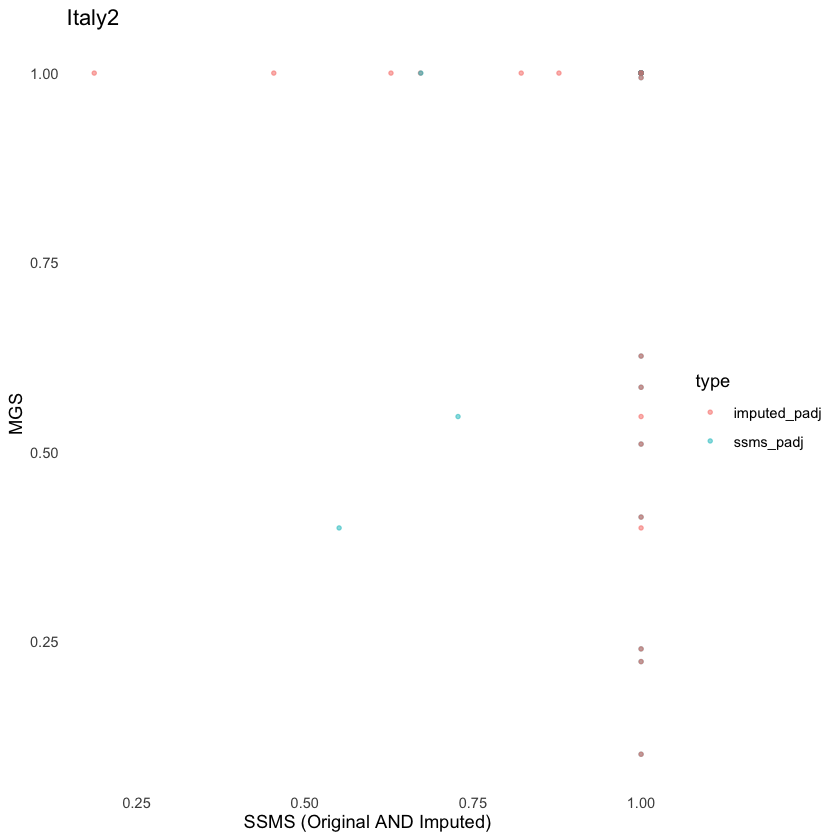

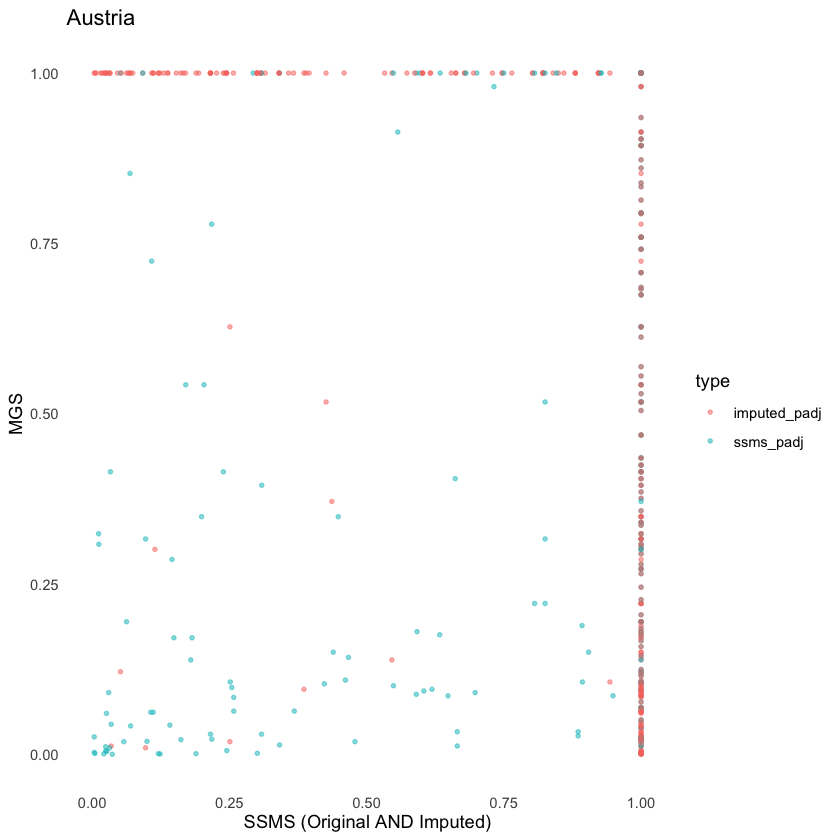

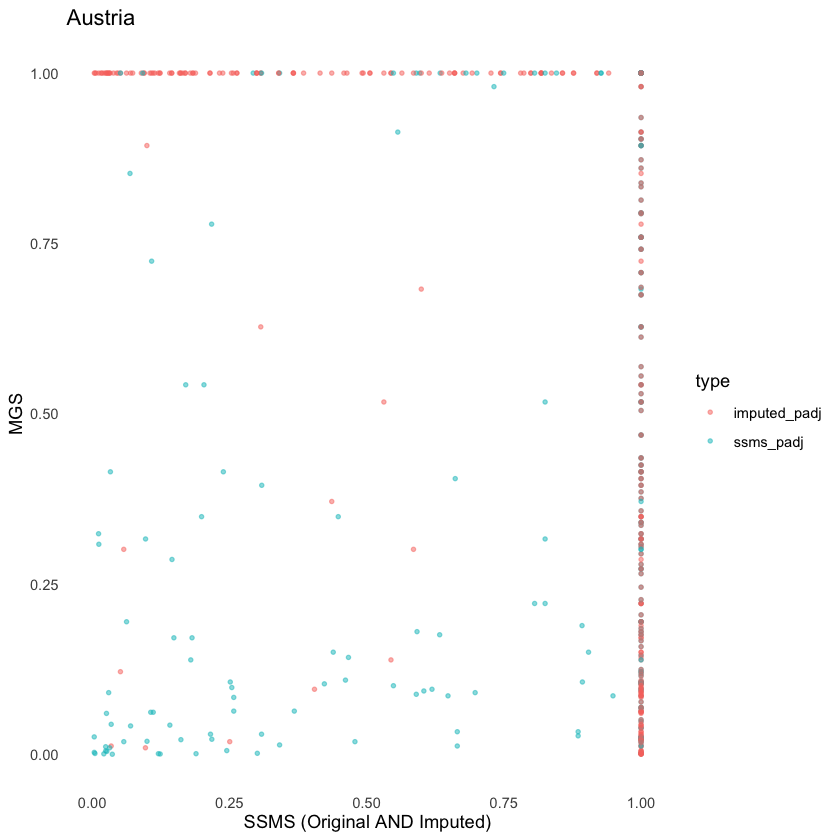

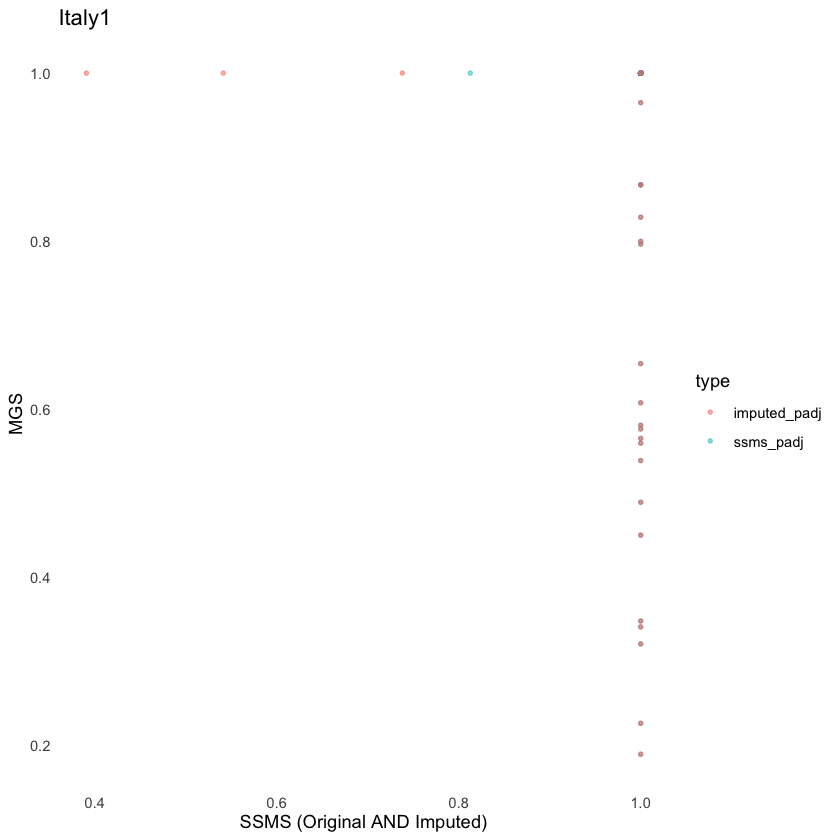

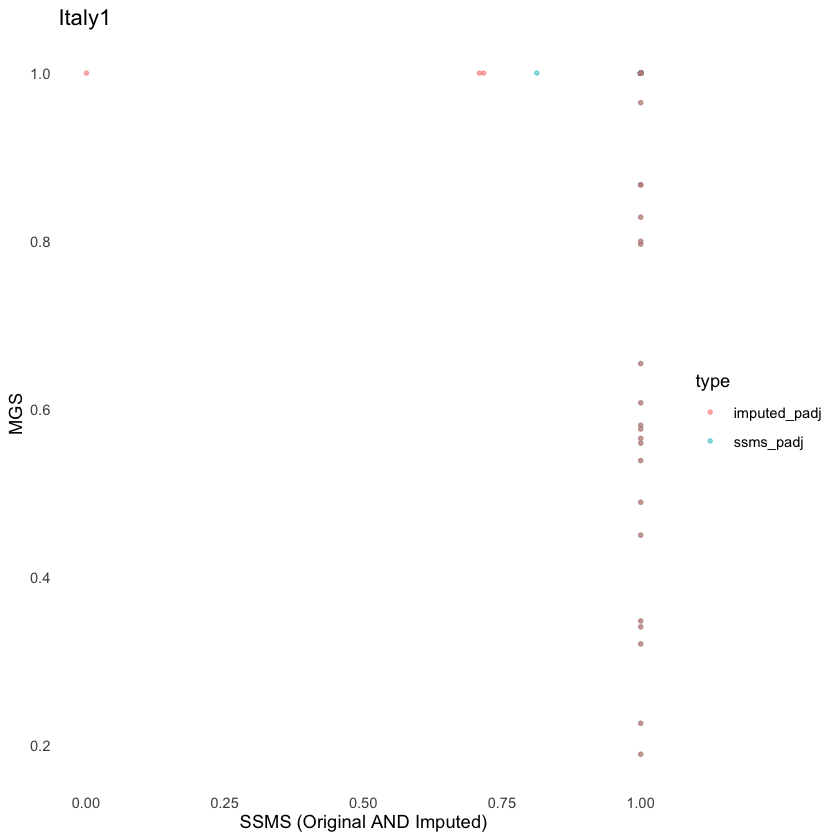

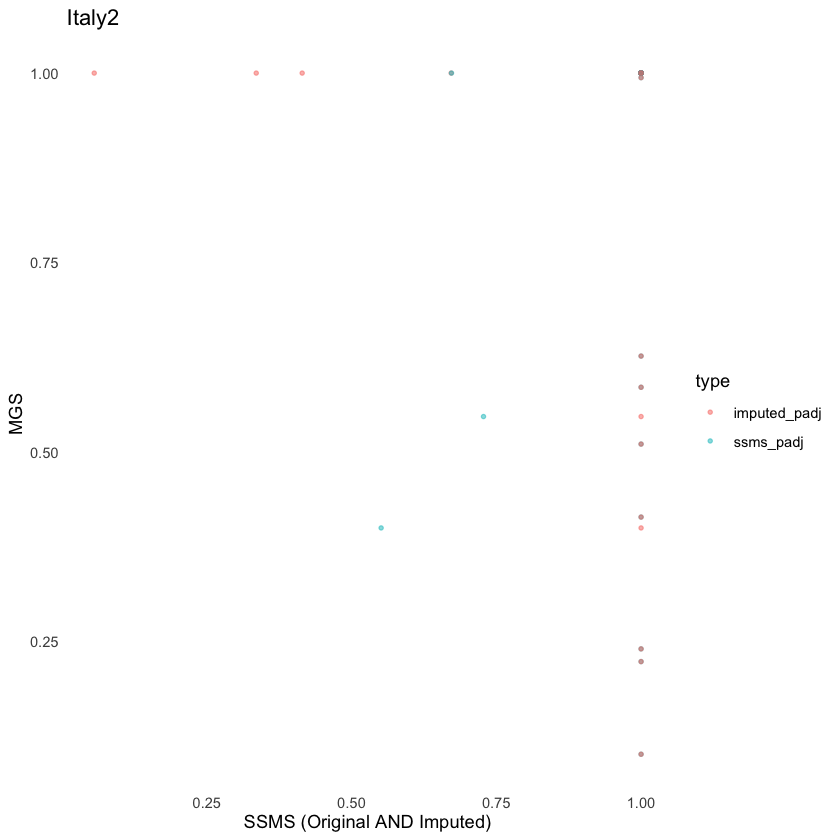

In [ ]:
# pvalue
source("utilities.R")
pvalue_level4ec_Italy1asref_Italy2 <- calculate_pvalue(metadata = Italy2_metadata,
                                                 mgs_matrix = Italy2_mgs_level4ec,
                                                 shallow_matrix = Italy2_ssms_level4ec,
                                                 imputed_matrix = predicted_level4ec_spiec_Italy1asref_Italy2,
                                                 condition_col = "study_condition",
                                                 control_label = "control",
                                                 crc_label = "CRC",
                                                 group_id_col = "run_accession",
                                                 set_names = c("MGS", "Shallow", "Imputed"))

pvalue_level4ec_Austriaasref_Italy2 <- calculate_pvalue(
  metadata = Italy2_metadata,
  mgs_matrix = Italy2_mgs_level4ec,
  shallow_matrix = Italy2_ssms_level4ec,
  imputed_matrix = predicted_level4ec_spiec_Austriaasref_Italy2,
  condition_col = "study_condition",
  control_label = "control",
  crc_label = "CRC",
  group_id_col = "run_accession",
  set_names = c("MGS", "Shallow", "Imputed"))

pvalue_level4ec_Italy2asref_Italy1 <- calculate_pvalue(metadata = Italy1_metadata,
                                                       mgs_matrix = Italy1_mgs_level4ec,
                                                       shallow_matrix = Italy1_ssms_level4ec,
                                                       imputed_matrix = predicted_level4ec_spiec_Italy2asref_Italy1,
                                                       condition_col = "study_condition",
                                                       control_label = "control",
                                                       crc_label = "CRC",
                                                       group_id_col = "run_accession",
                                                       set_names = c("MGS", "Shallow", "Imputed"))

pvalue_level4ec_Austriaasref_Italy1 <- calculate_pvalue(metadata = Italy1_metadata,
                                                        mgs_matrix = Italy1_mgs_level4ec,
                                                        shallow_matrix = Italy1_ssms_level4ec,
                                                        imputed_matrix = predicted_level4ec_spiec_Austriaasref_Italy1,
                                                        condition_col = "study_condition",
                                                        control_label = "control",
                                                        crc_label = "CRC",
                                                        group_id_col = "run_accession",
                                                        set_names = c("MGS", "Shallow", "Imputed"))

pvalue_level4ec_Italy1asref_Austria <- calculate_pvalue(metadata = Austria_metadata,
                                                        mgs_matrix = Austria_mgs_level4ec,
                                                        shallow_matrix = Austria_ssms_level4ec,
                                                        imputed_matrix = predicted_level4ec_spiec_Italy1asref_Austria,
                                                        condition_col = "study_condition",
                                                        control_label = "control",
                                                        crc_label = "CRC",
                                                        group_id_col = "NCBI_accession",
                                                        set_names = c("MGS", "Shallow", "Imputed"))

pvalue_level4ec_Italy2asref_Austria <- calculate_pvalue(metadata = Austria_metadata,
                                                        mgs_matrix = Austria_mgs_level4ec,
                                                        shallow_matrix = Austria_ssms_level4ec,
                                                        imputed_matrix = predicted_level4ec_spiec_Italy2asref_Austria,
                                                        condition_col = "study_condition",
                                                        control_label = "control",
                                                        crc_label = "CRC",
                                                        group_id_col = "NCBI_accession",
                                                        set_names = c("MGS", "Shallow", "Imputed"))

pvalue_level4ec_Italy1asref_Italy2_long <- pivot_longer(pvalue_level4ec_Italy1asref_Italy2, cols = c(ssms_padj, imputed_padj), 
                                                        names_to = "type", values_to = "x_value")
pvalue_level4ec_Italy1asref_Austria_long <- pivot_longer(pvalue_level4ec_Italy1asref_Austria, cols = c(ssms_padj, imputed_padj), 
                                                         names_to = "type", values_to = "x_value")                      
pvalue_level4ec_Italy2asref_Austria_long <- pivot_longer(pvalue_level4ec_Italy2asref_Austria, cols = c(ssms_padj, imputed_padj), 
                                                         names_to = "type", values_to = "x_value")
pvalue_level4ec_Italy2asref_Italy1_long <- pivot_longer(pvalue_level4ec_Italy2asref_Italy1, cols = c(ssms_padj, imputed_padj), 
                                                        names_to = "type", values_to = "x_value")                      
pvalue_level4ec_Austriaasref_Italy2_long <- pivot_longer(pvalue_level4ec_Austriaasref_Italy2, cols = c(ssms_padj, imputed_padj), 
                                                         names_to = "type", values_to = "x_value")
pvalue_level4ec_Austriaasref_Italy1_long <- pivot_longer(pvalue_level4ec_Austriaasref_Italy1, cols = c(ssms_padj, imputed_padj), 
                                                         names_to = "type", values_to = "x_value")                      


ggplot(pvalue_level4ec_Italy1asref_Italy2_long, aes(x = x_value, y = mgs_padj, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Italy2")

ggplot(pvalue_level4ec_Italy1asref_Austria_long, aes(x = x_value, y = mgs_padj, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Austria")

ggplot(pvalue_level4ec_Italy2asref_Austria_long, aes(x = x_value, y = mgs_padj, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Austria")

ggplot(pvalue_level4ec_Italy2asref_Italy1_long, aes(x = x_value, y = mgs_padj, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Italy1")

ggplot(pvalue_level4ec_Austriaasref_Italy1_long, aes(x = x_value, y = mgs_padj, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) + 
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Italy1")

ggplot(pvalue_level4ec_Austriaasref_Italy2_long, aes(x = x_value, y = mgs_padj, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) + 
  theme_minimal() +
  theme(panel.grid = element_blank())+
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Italy2")



Warning message:
"Removed 1587 rows containing missing values or values outside the scale range
(`geom_point()`)."
Warning message:
"Removed 994 rows containing missing values or values outside the scale range
(`geom_point()`)."


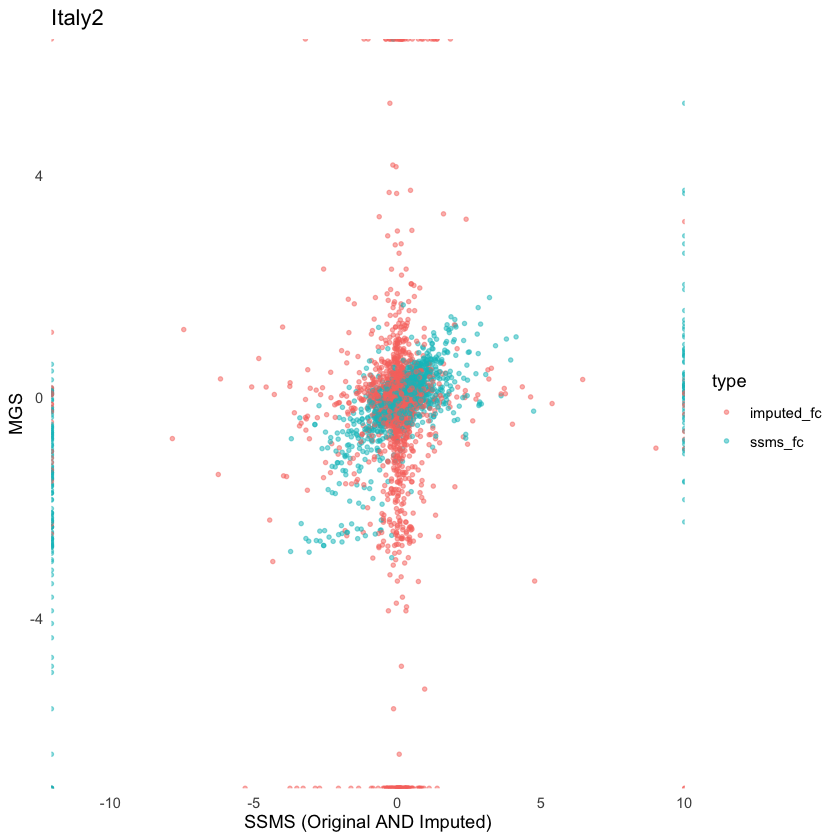

Warning message:
"Removed 1101 rows containing missing values or values outside the scale range
(`geom_point()`)."


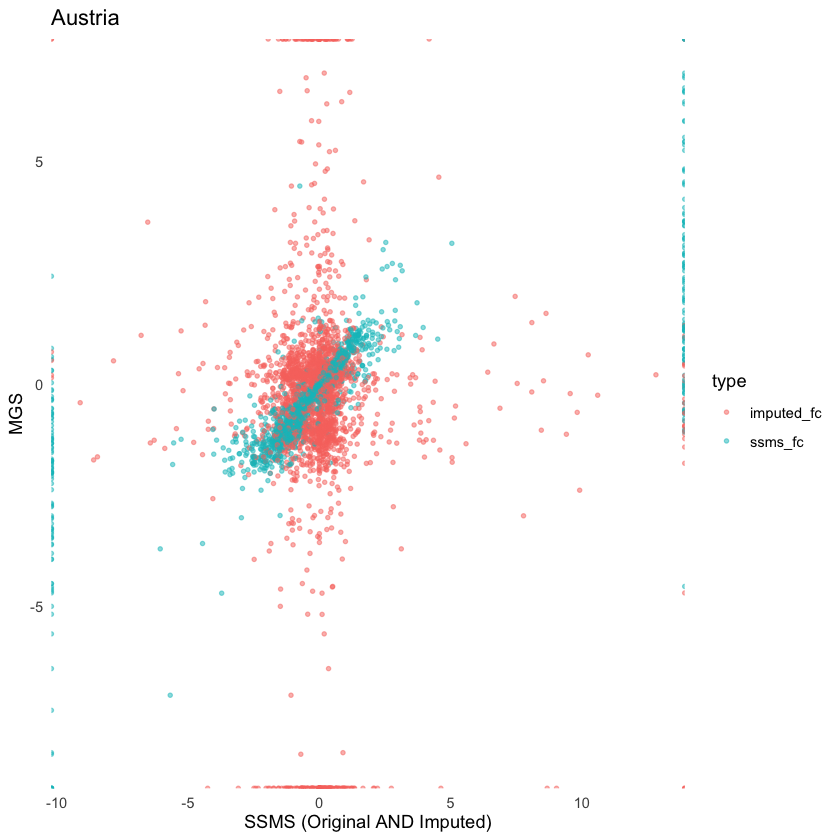

Warning message:
"Removed 1365 rows containing missing values or values outside the scale range
(`geom_point()`)."


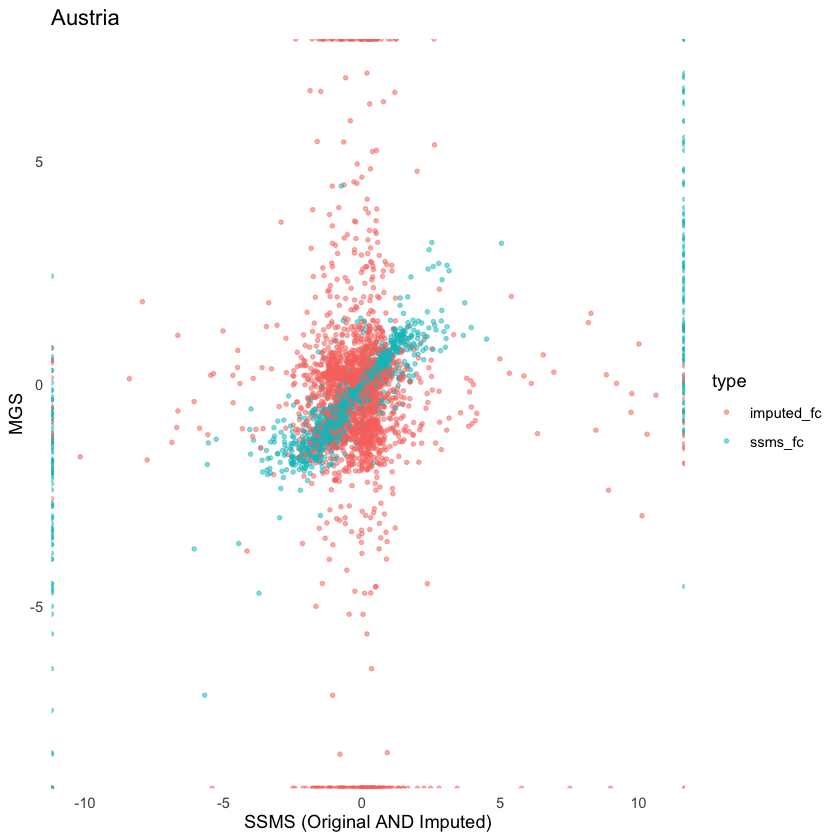

Warning message:
"Removed 1325 rows containing missing values or values outside the scale range
(`geom_point()`)."


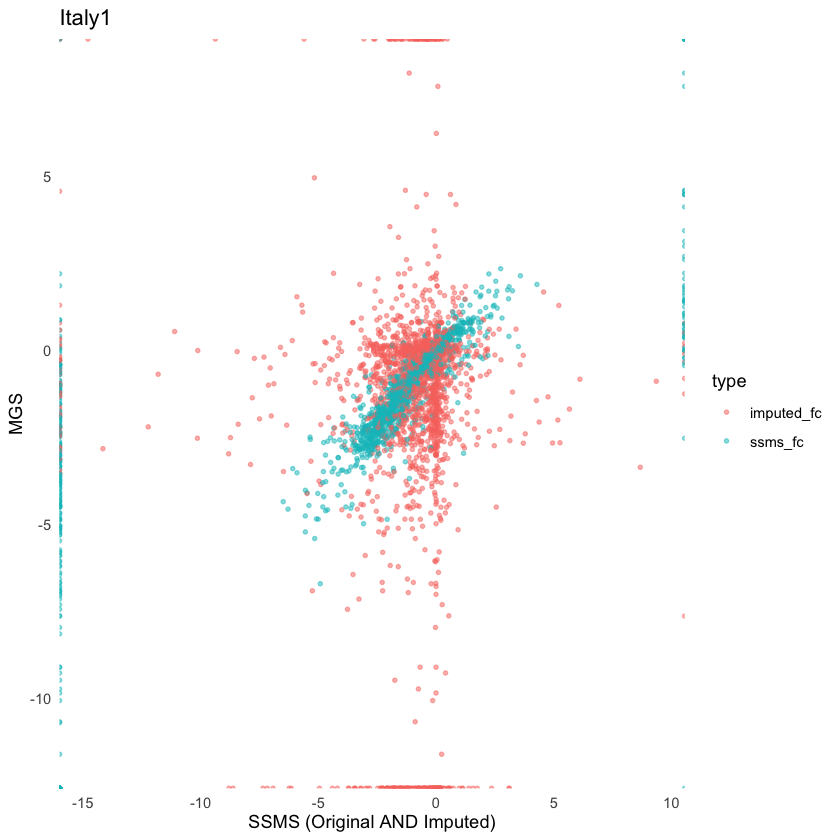

Warning message:
"Removed 1597 rows containing missing values or values outside the scale range
(`geom_point()`)."


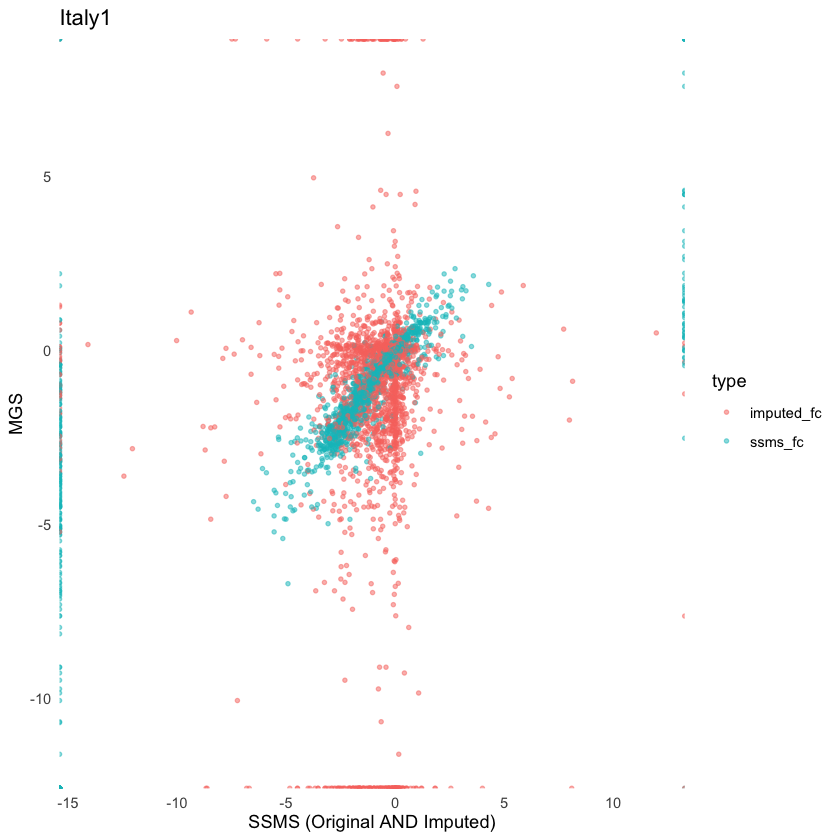

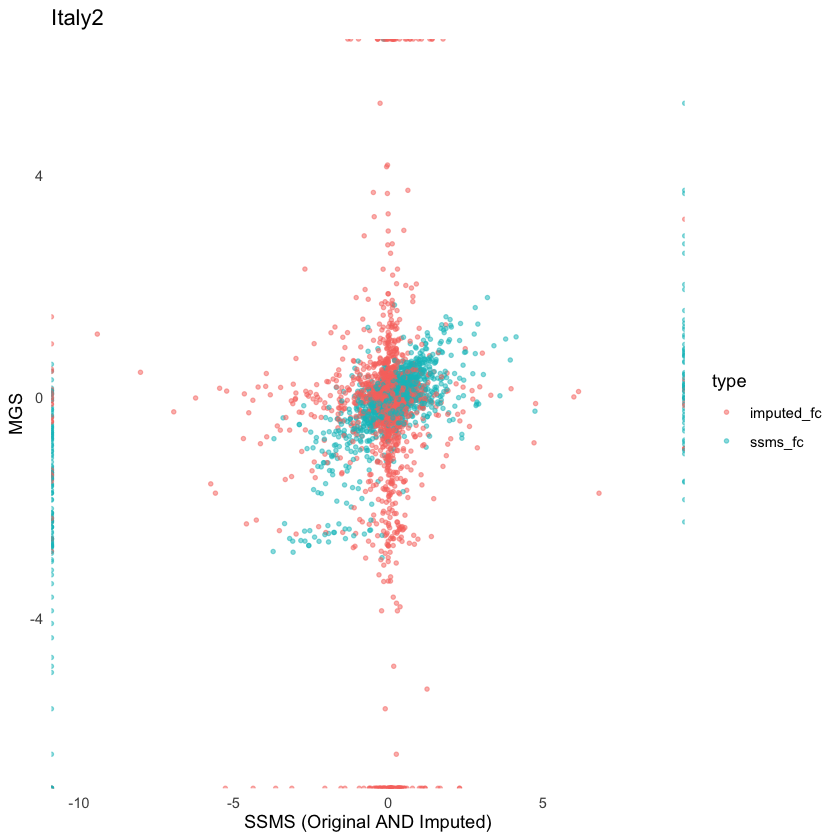

In [ ]:
# fc
source("utilities.R")
fc_level4ec_Italy1asref_Italy2 <- calculate_fc(metadata = Italy2_metadata,
                                                       mgs_matrix = Italy2_mgs_level4ec,
                                                       shallow_matrix = Italy2_ssms_level4ec,
                                                       imputed_matrix = predicted_level4ec_spiec_Italy1asref_Italy2,
                                                       condition_col = "study_condition",
                                                       control_label = "control",
                                                       crc_label = "CRC",
                                                       group_id_col = "run_accession",
                                                       set_names = c("MGS", "Shallow", "Imputed"))

fc_level4ec_Austriaasref_Italy2 <- calculate_fc(
  metadata = Italy2_metadata,
  mgs_matrix = Italy2_mgs_level4ec,
  shallow_matrix = Italy2_ssms_level4ec,
  imputed_matrix = predicted_level4ec_spiec_Austriaasref_Italy2,
  condition_col = "study_condition",
  control_label = "control",
  crc_label = "CRC",
  group_id_col = "run_accession",
  set_names = c("MGS", "Shallow", "Imputed"))

fc_level4ec_Italy2asref_Italy1 <- calculate_fc(metadata = Italy1_metadata,
                                                       mgs_matrix = Italy1_mgs_level4ec,
                                                       shallow_matrix = Italy1_ssms_level4ec,
                                                       imputed_matrix = predicted_level4ec_spiec_Italy2asref_Italy1,
                                                       condition_col = "study_condition",
                                                       control_label = "control",
                                                       crc_label = "CRC",
                                                       group_id_col = "run_accession",
                                                       set_names = c("MGS", "Shallow", "Imputed"))

fc_level4ec_Austriaasref_Italy1 <- calculate_fc(metadata = Italy1_metadata,
                                                        mgs_matrix = Italy1_mgs_level4ec,
                                                        shallow_matrix = Italy1_ssms_level4ec,
                                                        imputed_matrix = predicted_level4ec_spiec_Austriaasref_Italy1,
                                                        condition_col = "study_condition",
                                                        control_label = "control",
                                                        crc_label = "CRC",
                                                        group_id_col = "run_accession",
                                                        set_names = c("MGS", "Shallow", "Imputed"))

fc_level4ec_Italy1asref_Austria <- calculate_fc(metadata = Austria_metadata,
                                                        mgs_matrix = Austria_mgs_level4ec,
                                                        shallow_matrix = Austria_ssms_level4ec,
                                                        imputed_matrix = predicted_level4ec_spiec_Italy1asref_Austria,
                                                        condition_col = "study_condition",
                                                        control_label = "control",
                                                        crc_label = "CRC",
                                                        group_id_col = "NCBI_accession",
                                                        set_names = c("MGS", "Shallow", "Imputed"))

fc_level4ec_Italy2asref_Austria <- calculate_fc(metadata = Austria_metadata,
                                                        mgs_matrix = Austria_mgs_level4ec,
                                                        shallow_matrix = Austria_ssms_level4ec,
                                                        imputed_matrix = predicted_level4ec_spiec_Italy2asref_Austria,
                                                        condition_col = "study_condition",
                                                        control_label = "control",
                                                        crc_label = "CRC",
                                                        group_id_col = "NCBI_accession",
                                                        set_names = c("MGS", "Shallow", "Imputed"))

fc_level4ec_Italy1asref_Italy2_long <- pivot_longer(fc_level4ec_Italy1asref_Italy2, cols = c(ssms_fc, imputed_fc), 
                                                        names_to = "type", values_to = "x_value")
fc_level4ec_Italy1asref_Austria_long <- pivot_longer(fc_level4ec_Italy1asref_Austria, cols = c(ssms_fc, imputed_fc), 
                                                         names_to = "type", values_to = "x_value")                      
fc_level4ec_Italy2asref_Austria_long <- pivot_longer(fc_level4ec_Italy2asref_Austria, cols = c(ssms_fc, imputed_fc), 
                                                         names_to = "type", values_to = "x_value")
fc_level4ec_Italy2asref_Italy1_long <- pivot_longer(fc_level4ec_Italy2asref_Italy1, cols = c(ssms_fc, imputed_fc), 
                                                        names_to = "type", values_to = "x_value")                      
fc_level4ec_Austriaasref_Italy2_long <- pivot_longer(fc_level4ec_Austriaasref_Italy2, cols = c(ssms_fc, imputed_fc), 
                                                         names_to = "type", values_to = "x_value")
fc_level4ec_Austriaasref_Italy1_long <- pivot_longer(fc_level4ec_Austriaasref_Italy1, cols = c(ssms_fc, imputed_fc), 
                                                         names_to = "type", values_to = "x_value")                      

ggplot(fc_level4ec_Italy1asref_Italy2_long, aes(x = x_value, y = mgs_fc, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Italy2")

ggplot(fc_level4ec_Italy1asref_Austria_long, aes(x = x_value, y = mgs_fc, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Austria")

ggplot(fc_level4ec_Italy2asref_Austria_long, aes(x = x_value, y = mgs_fc, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Austria")

ggplot(fc_level4ec_Italy2asref_Italy1_long, aes(x = x_value, y = mgs_fc, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Italy1")

ggplot(fc_level4ec_Austriaasref_Italy1_long, aes(x = x_value, y = mgs_fc, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Italy1")

ggplot(fc_level4ec_Austriaasref_Italy2_long, aes(x = x_value, y = mgs_fc, shape = type, color = type)) +
  geom_point(alpha = 0.5) +
  scale_shape_manual(values = c(20, 20)) +  
  theme_minimal() +
  theme(panel.grid = element_blank()) +
  labs(x = "SSMS (Original AND Imputed)",
       y = "MGS",
       title = "Italy2")



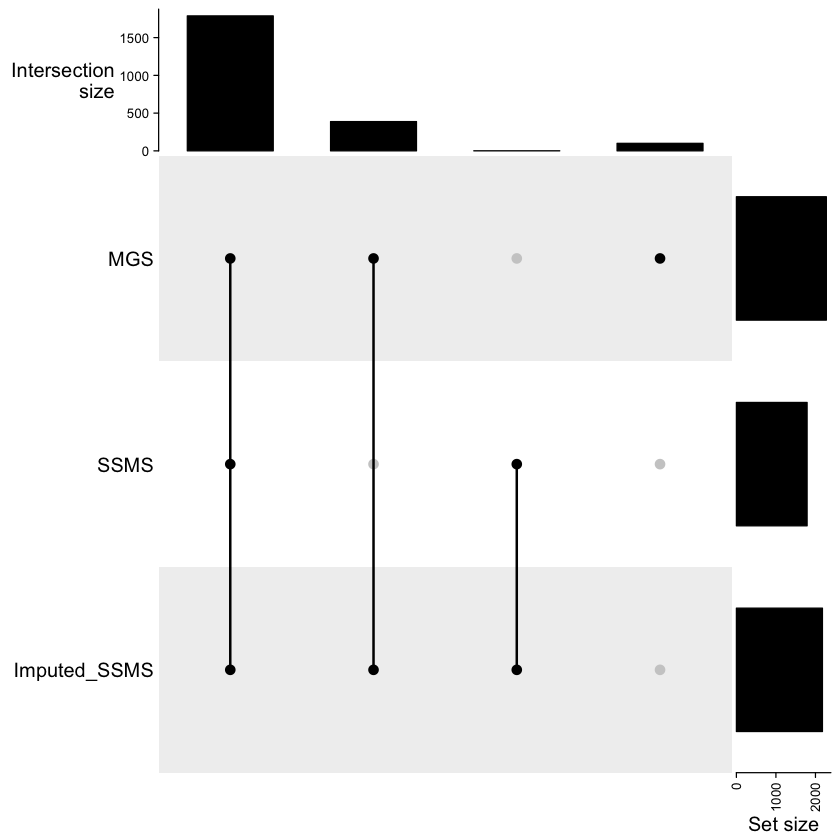

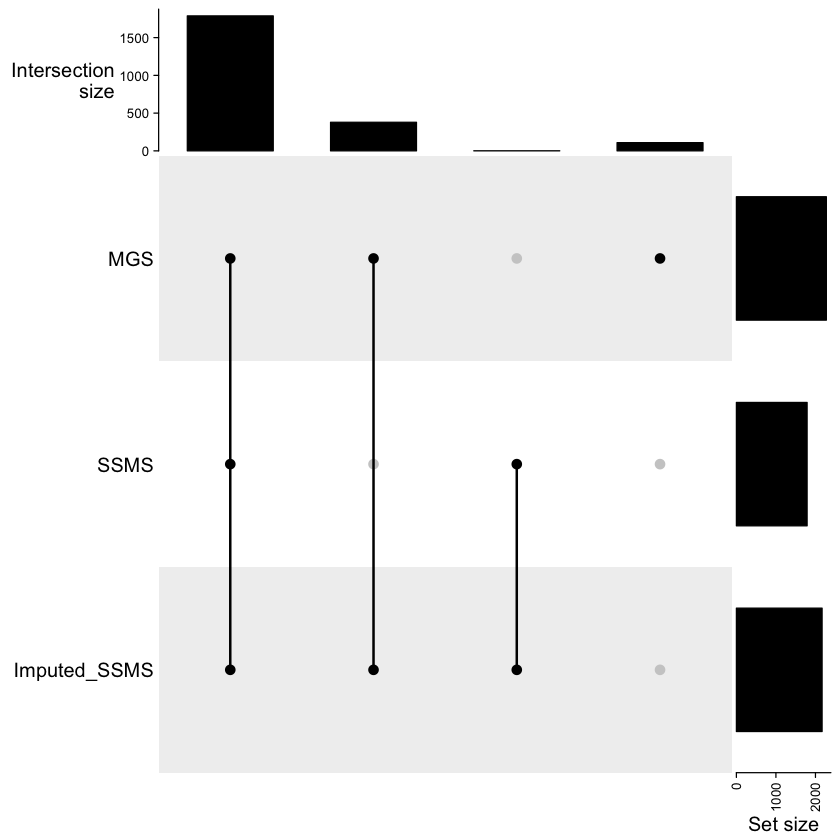

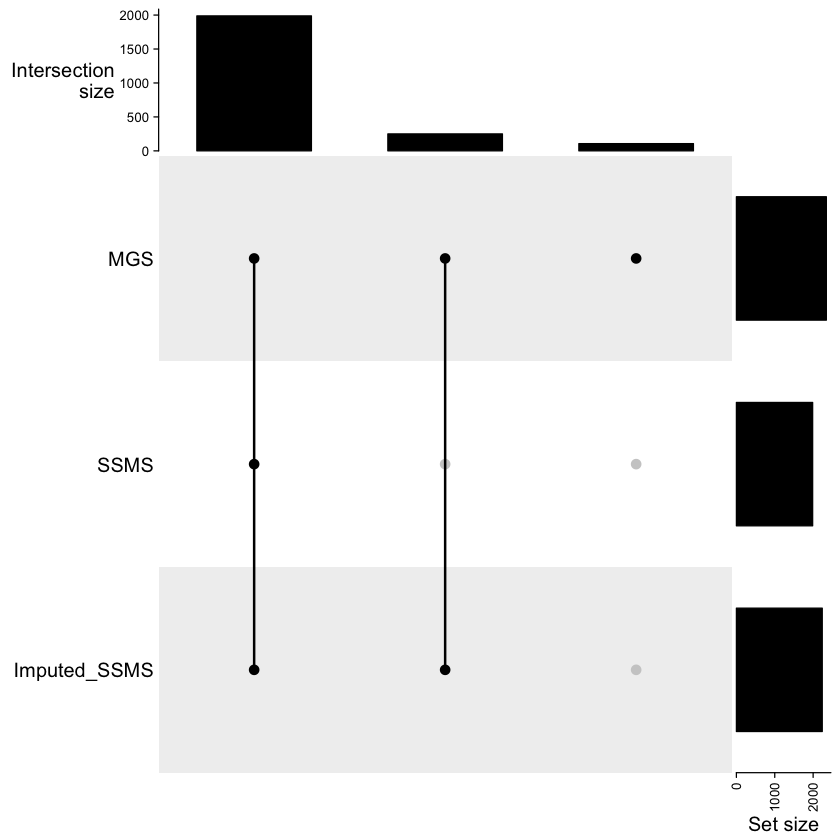

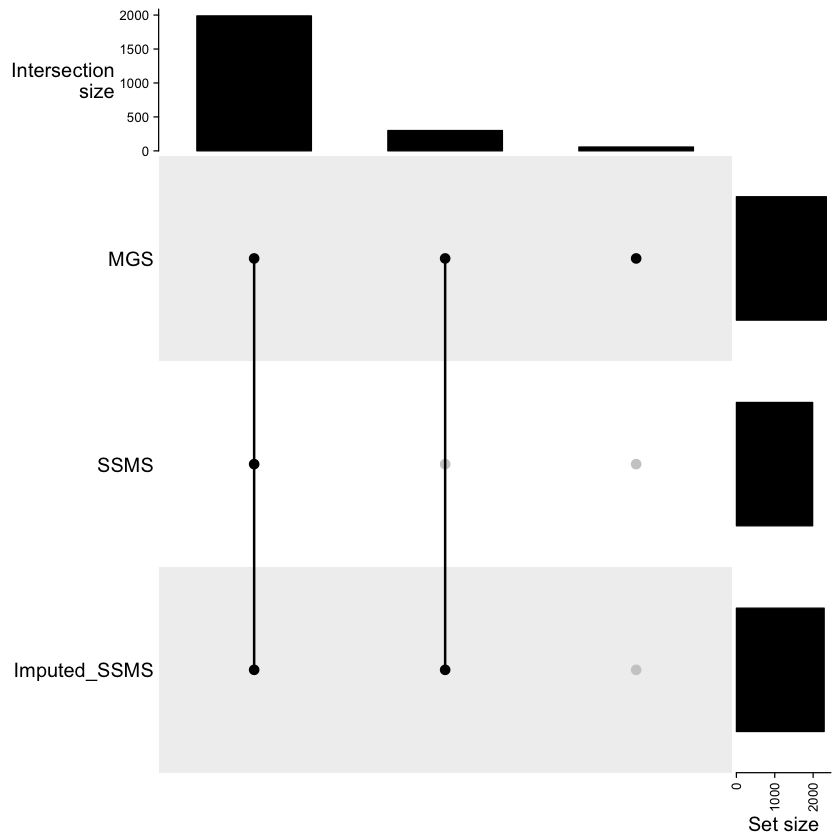

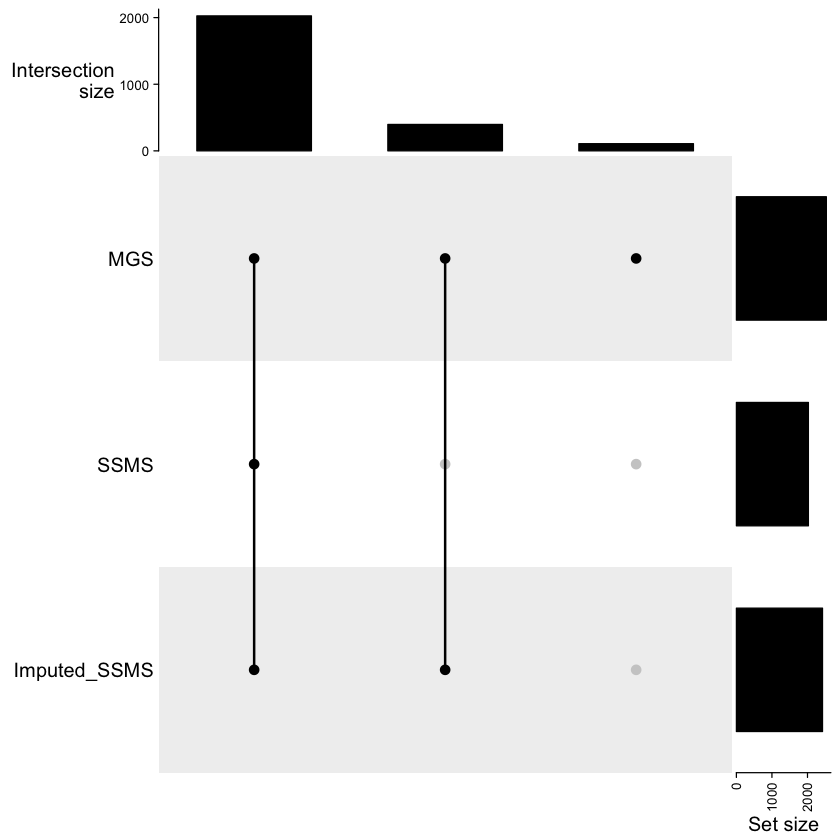

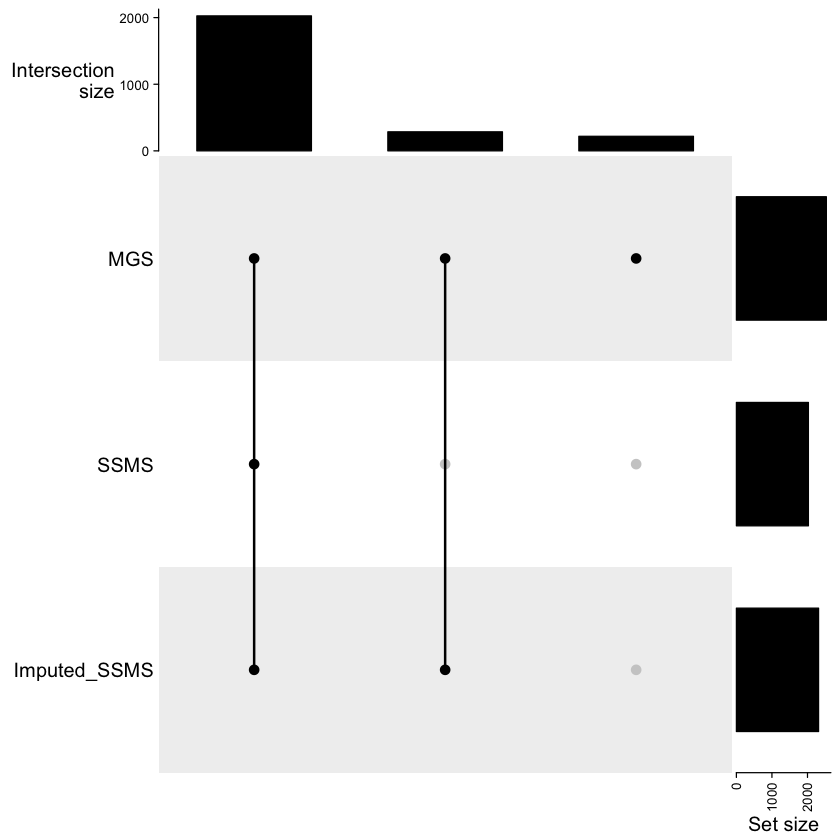

In [51]:
# venn 

library(VennDiagram)
library(VennDiagram)
library(eulerr)
library(UpSetR)
library(ComplexHeatmap)

source("utilities.R")

# Italy1asref_Italy2 
plot_upset(list(
  "MGS" = Italy2_mgs_level4ec,
  "SSMS" = Italy2_ssms_level4ec,
  "Imputed_SSMS" = predicted_level4ec_spiec_Italy1asref_Italy2
))

# Austriaasref_Italy2
plot_upset(list(
  "MGS" = Italy2_mgs_level4ec,
  "SSMS" = Italy2_ssms_level4ec,  
  "Imputed_SSMS" = predicted_level4ec_spiec_Austriaasref_Italy2
))  

# Italy2asref_Italy1
plot_upset(list(
  "MGS" = Italy1_mgs_level4ec,
  "SSMS" = Italy1_ssms_level4ec,  
  "Imputed_SSMS" = predicted_level4ec_spiec_Italy2asref_Italy1  
))

# Austriaasref_Italy1
plot_upset(list(
  "MGS" = Italy1_mgs_level4ec,
  "SSMS" = Italy1_ssms_level4ec,
  "Imputed_SSMS" = predicted_level4ec_spiec_Austriaasref_Italy1
))  

# Italy1asref_Austria
plot_upset(list(
  "MGS" = Austria_mgs_level4ec, 
  "SSMS" = Austria_ssms_level4ec,
  "Imputed_SSMS" = predicted_level4ec_spiec_Italy1asref_Austria 
))

# Italy2asref_Austria
plot_upset(list(
  "MGS" = Austria_mgs_level4ec,
  "SSMS" = Austria_ssms_level4ec, 
  "Imputed_SSMS" = predicted_level4ec_spiec_Italy2asref_Austria
))   

In [ ]:
# test
non_null_sets <- lapply(list(
  "MGS" = Italy2_mgs_level4ec,
  "SSMS" = Italy2_ssms_level4ec,  
  "Imputed_SSMS" = predicted_level4ec_spiec_Italy1asref_Italy2  
), function(mat) {
   degs <- rowSums(mat != 0)
   names(degs[degs > 0])
 })

mgs <- non_null_sets[[1]]
ssms <- non_null_sets[[2]]
Imputed_SSMS <- non_null_sets[[3]]
ssms[!ssms %in% mgs]


List of 3
 $ MGS         : chr [1:2276] "UNMAPPED" "UNGROUPED" "1.1.1.1" "1.1.1.100" ...
 $ SSMS        : chr [1:1789] "UNMAPPED" "UNGROUPED" "1.1.1.1" "1.1.1.100" ...
 $ Imputed_SSMS: chr [1:2177] "1.1.1.1" "1.1.1.100" "1.1.1.103" "1.1.1.107" ...


[1] "2.3.2.5"